In [1]:
import ee, pdb, os
ee.Authenticate() 

Enter verification code: 4/1AanRRruZZl3pz33K0eeEJT0aAYzcw8ekgSyMS_7-7vTiEzR7MEHHMXHLHww

Successfully saved authorization token.


## Next step is to make a new census table with recent data
use the script in zips.ipynb  -- make sure to get full geoid
get shapefiles for stansilaus and san joaquin counties
https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.html
https://www.census.gov/programs-surveys/geography/technical-documentation/complete-technical-documentation/tiger-geo-line.2021.html#list-tab-240499709

DONE above
NEXT:
pick census features to look at
download census files
merge shapefile with census file
FILTER for just stanislaus and san joaquin counties




In [2]:
import pandas as pd
import numpy as np
import requests, csv
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
#build census data csv use nosicensus ipynb


## Run from here if nosicensusdf already generated: make census tract maps for region

In [3]:
df = pd.read_csv('nosi2017census.csv')

In [4]:
df.GEOID = df.GEOID.astype(str)

In [5]:
#add in shapefile data from Census, make sure to take care of the YEAR.  There was a big change in 2020
import geopandas as gpd
camap = gpd.read_file('C:/Users/ariver10/Documents/nosi/2015CAtracts/tl_2015_06_tract.shp')
#camap['GEOID'] = pd.to_numeric(camap.GEOID)
temp = camap['geometry'].to_crs("ESRI:102003")
camap['shapearea'] = temp.area
camap['shapelength'] = temp.length

#merge shapefile and df
dfmap = camap.merge(df, how = 'left', on = 'GEOID')
dfmap.GEOID = dfmap.GEOID .str.zfill(11)




In [7]:
dfmap= dfmap[['ALAND', 'AWATER', 'Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Total__Population_25_and_over', 'Total_Regular_high_school_diploma',
       'Total_GED_or_alternative_credential',
       'Total_Some_college_less_than_1_year',
       'Total_Some_college_1_or_more_years_no_degree', 'Associates',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Total_With_earnings', 'Total_No_earnings',
       'Total_With_Social_Security_income', 'Total_No_Social_Security_income',
       'Total__Households.1', 'Total_With_Supplemental_Security_Income_(SSI)',
       'Total_With_public_assistance_income',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Total__Race', 'Total_Population', 'Total_White_alone',
       'Total_Black_or_African_American_alone',
       'Total_American_Indian_and_Alaska_Native_alone', 'Total_Asian_alone',
       'Total_Native_Hawaiian_and_Other_Pacific_Islander_alone',
       'Total_Some_other_race_alone', 'Total_Two_or_more_races',
       'Working_hours', 'Gini_index', 'state', 'county', 'tract',
       'percent_degree', 'Poverty', 'Unemployed', 'assistance', 'GEOID','INTPTLAT', 'INTPTLON', 'geometry']]

## GEE code starts here

In [3]:
ee.Initialize()
from geeViz import taskManagerLib

#-----------------------------------------------------
#			Options
#-----------------------------------------------------
export_distances = False
export_nlcd = True
export_potential_area = False
export_climate_zones = False
export_income_population = False
export_canopy_cover = True
export_canopy_area = True
export_geos = True


In [4]:
# Tiger Urban Areas
#This was generated in the GEE scripts
tiger = ee.FeatureCollection('projects/ee-ajnaram/assets/UrbanAreasCV')

In [5]:
# CBGs with UHI/LST values and City Name
# Get these from this script: https://code.earthengine.google.com/5f05c717099f6e6b564afa13b2f9c161, (Gmail from TC Feb. 25 2021)
lst_cbg = ee.FeatureCollection('projects/ee-ajnaram/assets/CVUHI_cb_vf_All').distinct(['.geo', 'GEOID', 'Urban_LSTsummer']) # There are some duplicates\
cbg_tcc = lst_cbg.select(['NAME','GEOID','ALAND','AWATER','Ar_pixel'])
lst_cbg = lst_cbg.select(['NAME','GEOID'])

In [6]:
props = ee.FeatureCollection('projects/ee-ajnaram/assets/CVUHI_cb_vf_All').first().propertyNames().getInfo()
props2 = lst_cbg.first().propertyNames().getInfo()
props3 = cbg_tcc.first().propertyNames().getInfo()

print( cbg_tcc.first().propertyNames().getInfo())

['system:index', 'Ar_pixel', 'GEOID', 'AWATER', 'ALAND', 'NAME']


## Next step is to build my own Central Valley blockgroup Feature collection
idea: select by county (San Joaquin, Merced, Sacramento)

In [ ]:
#DECIDED NOT TO USE THE FOLLOWING FOR TREE COVER
tracts = ee.FeatureCollection('projects/ee-ajnaram/assets/CV_AllCities_Tracts')

# NLCD Land cover at 30m resolution
nlcd = ee.Image('USGS/NLCD/NLCD2016').select('landcover')
nlcd = nlcd.updateMask(nlcd.neq(11))


# Earth Define Canopy cover at 1m resolution
# earthdefine image collection 
earthdefine = ee.ImageCollection('users/leahscampbell/contour/tnc/urbantree/EarthDefine').mosaic().unmask(ee.Image(0),False).updateMask(nlcd.neq(11)).clip(tracts)



In [ ]:
#USE THIS ONE INSTEAD OF ABOVE FOR TRACTS

# Import the tree canopy cover collection
nlcd_tcc = ee.ImageCollection('USGS/NLCD_RELEASES/2021_REL/TCC/v2021-4');

#Filter collection to 2021 and CONUS study area 
nlcd_tcc = nlcd_tcc.filter(ee.Filter.calendarRange(2015, 2015, 'year')).filter(ee.Filter.eq('study_area', 'CONUS')).first()   # or "AK", "PRUSVI", "HAWAII".first()
tcc = nlcd_tcc.select('NLCD_Percent_Tree_Canopy_Cover')


#without clipping water, should already be done in tcc
tcc = tcc.clip(cbg_tcc)

#earthdefine from older paper.Note that this is ONLY for urban areas and will skip rural areas
earthdefine = ee.ImageCollection('users/leahscampbell/contour/tnc/urbantree/EarthDefine').mosaic()\
  .unmask(ee.Image(0),False).updateMask(nlcd.neq(11)).clip(tracts)

In [9]:
# Size parameters for filtering clipped geometries (see more info below)
canopyDataMaskMinSize = 15000
canopyDataMask2MinSize = 200000
canopyDataMaskPortion = 0.01
canopyDataMaskRatio = 0.9
#----------------------------

In [10]:
#----------------------------------------------------------
#           Initialize List of Cities
#----------------------------------------------------------
# List of cities to loop through
areaList = lst_cbg.aggregate_histogram('NAME').keys().getInfo()
areaNameStrings = []
for name in areaList:
	cleanName = name.split(',')[0]\
              .replace(' ','')\
              .replace(')','')\
              .replace('(','')\
              .replace('.','')
	areaNameStrings.append(cleanName)
areaDict = {areaList[i]: areaNameStrings[i] for i in range(len(areaList))}

In [59]:
#----------------------------------------------------------
#           Calculate and Export Distances
#----------------------------------------------------------
if export_distances:
    print('Export Distances')
    def add_distance(feature):
        centr = feature.geometry().centroid()
        urb_centr = ee.Feature(tiger.filter(ee.Filter.eq('NAME10', feature.get('NAME'))).first()).geometry().centroid()
        dist_urb = ee.Number(centr.distance(urb_centr, 5))
        return feature.set({'Dist_urbCenter': dist_urb})

    cityDistances = []
    for cityName in areaList:
        print('Distances:', cityName)

        cityCBGs = lst_cbg.filter(ee.Filter.eq('NAME', cityName))

        distances = cityCBGs.map(add_distance)

        cityDistances.append(distances)

    exportDistances = ee.FeatureCollection(cityDistances).flatten()

# Set geometries to null so that .geo column doesn't make the file huge.
    exportDistances = exportDistances.map(lambda cbg: cbg.setGeometry(None))

#    t = ee.batch.Export.table.toAsset({'collection': exportDistances, 'description': 'Distances_Table_toStorage',  'assetId':'users/ajnaram/Distances_CBG_Table_All', 'fileFormat': 'CSV'})
#    t.start()
#Export the image sample feature collection to Drive as a CSV file.
    task = ee.batch.Export.table.toDrive(collection=exportDistances, description='Distances_table', fileFormat='CSV')
    task.start()

In [12]:

#----------------------------------------------------------
#           Calculate and Export NLCD Percentages
#----------------------------------------------------------
if export_nlcd:
	print('Export NLCD')

	# Add NLCD Classes & Canopy Percent
	nlcdImage = ee.Image(nlcd.eq(21)).rename('NLCD_Dev_OpenSpace_Perc')\
		.addBands(ee.Image(nlcd.eq(22)).rename('NLCD_Dev_LowIntensity_Perc'))\
		.addBands(ee.Image(nlcd.eq(23)).rename('NLCD_Dev_MedIntensity_Perc'))\
		.addBands(ee.Image(nlcd.eq(24)).rename('NLCD_Dev_HighIntensity_Perc'))\
		.addBands(ee.Image(nlcd.lt(21).Or(nlcd.gt(24))).rename('NLCD_Other_Perc'))

	exportNLCD = nlcdImage.reduceRegions(**{\
		'collection': lst_cbg,
		'reducer': ee.Reducer.mean(), 
		'scale': 30, 
		'crs': None, 
		'crsTransform': None, 
		'tileScale': 1})

	# Set geometries to null so that .geo column doesn't make the file huge.
	exportNLCD = exportNLCD.map(lambda cbg: cbg.setGeometry(None))

	task = ee.batch.Export.table.toDrive(collection= exportNLCD, description= 'NLCD_Percent_Table_toAsset',fileFormat='CSV')
	task.start()

    
#----------------------------------------------------------
#           Calculate and Export Potential Area
#----------------------------------------------------------
if export_potential_area:
	print('Export Potential Area')

	urbanSuitability = urbanSuitability.rename('PotentialArea_m2')
	urbanSuitability = urbanSuitability.addBands(urbanSuitability.multiply(0.000247105).rename('PotentialArea_Acres'))

	exportPotArea = urbanSuitability.reduceRegions({
		'collection': lst_cbg,
		'reducer': ee.Reducer.sum(), 
		'scale': 30, 
		'crs': None, 
		'crsTransform': None, 
		'tileScale': 1})

	# Set geometries to null so that .geo column doesn't make the file huge.
	exportPotArea = exportPotArea.map(lambda cbg: cbg.setGeometry(None))


	t = ee.batch.Export.table.toAsset({
	    'collection': exportPotArea, 
	    'description': 'Potential_Area_Table_toAsset', 
	    'assetId': 'Potential_Area_CBG_Table_All', 'fileformat': 'CSV' })
	t.start()
    

#----------------------------------------------------------
#           Export Income, Population, and Households
#----------------------------------------------------------
if export_income_population:
	print('Export Income & Population')

	props = ['ALAND','AWATER','GEOID','Total__Households.1','Median_household_income','Total_Population']
	props_rename = ['aland','awater','geoid','Households','Income','Population']
	incomePop = incomePop.select(props, props_rename)

    

#taskt = ee.batch.Export.table.toAsset(
#    collection=incomePop,
#    description='IncomeandPop',
#    assetId='users/ajnaram/Income_Population_CBG_Table_All',
#)
#taskt.start()



Export NLCD


In [15]:
#----------------------------------------------------------
#           Calculate and Export Tree Canopy Cover
#----------------------------------------------------------
# These are exported by city because they take a while...and it fails if you do too many CBGs at once.
# If this fails at the GEE level, need to break up the areaList (only call ~25 cities at a time)
export_canopy_cover = True
export_canopy_area = False
if export_canopy_cover:
	print('Export Canopy Cover')

	# Pixel area, for use in canopy area calculation
	Im_Area=ee.Image.pixelArea().updateMask(nlcd.neq(11)).clip(cbg_tcc)

	for cityName in areaList:
		outStr = areaDict[cityName]
#		print('Canopy Cover:', cityName)
		cityPolys = cbg_tcc.filter(ee.Filter.eq('NAME', cityName))
#		print(cityName, 'cityPolys', cityPolys.first().propertyNames().getInfo())
#		print(cityName, 'cityPolys size', cityPolys.size().getInfo()) 

#		cityPolys = cityPolys.filter(ee.Filter.inList('GEOID', omit).Not())

		if cityPolys.size().getInfo() > 0:
			cityPolys = cityPolys.map(lambda poly: poly.set('mean', -99999))
#			print(cityName, 'cityPolys size worked')           
#			print(cityName, 'cityPolys', cityPolys.first().propertyNames().getInfo())           

			# Add Canopy Percentage
			canopyPercent = tcc.reduceRegions(**{\
				'collection': cityPolys,
	            'reducer': ee.Reducer.mean(), 
	            'scale': 1, 
	            'crs': None, 
	            'crsTransform': None, 
	            'tileScale': 8})
			print('Reducer worked', outStr)

			props = canopyPercent.first().propertyNames()
#			print('propsline',props.getInfo())
#			print('canopyPercent before replace',outStr, canopyPercent.getInfo())
			canopyPercent = canopyPercent.select(props, props.replace('mean','Canopy_Percent'))#.replace('sum','CanopyData_Area_1m'))
#			print('canopyPercentline',props.getInfo())
            
            
#			# Set geometries to null so that .geo column doesn't make the file huge.
			#canopyPercent = canopyPercent.map(lambda cbg: cbg.setGeometry(None))

			# Export
#			outStr = areaDict[cityName]
#			print(outStr, 'canopyPercent', canopyPercent.first().getInfo())
#			t = ee.batch.Export.table.toDrive(
#	            collection = canopyPercent, 
#	            description = "Canopy_Percent_"+outStr+"+Table_toStorage", 
#	            fileFormat = 'CSV')
#			t.start()
			if cityName != 'Arvin, CA':
				canopymaps = canopymaps.merge(canopyPercent)
			else:
				canopymaps = canopyPercent
#			t = ee.batch.Export.table.toAsset(**{\
#			    'collection': canopyPercent, 
#			    'description': 'Canopy_Percent_'+outStr+'_TractTable_toAsset', 
#			   'assetId': 'projects/ee-ajnaram/assets/Canopy_Percent_'+outStr+'Tract_Table'})
#			t.start()
t = ee.batch.Export.table.toAsset(**{'collection': canopymaps, 
'description': 'canopymapsallCVtracts', 
'assetId': 'projects/ee-ajnaram/assets/canopymapsallCVtractsTCCmeanWOFILTER'})
t.start()


# To check for failed tasks:
# tasks = ee.data.getTaskList()[0:211]
# status = [task['state'] for task in tasks]
# name = [task['description'] for task in tasks]
# for i, state in enumerate(status):
#   if state == 'FAILED':
#     print('FAILED: '+name[i])

#----------------------------------------------------------
#           Calculate and Export Canopy Data Areas
#----------------------------------------------------------
# These are exported by city because they take a while...and it fails if you do too many CBGs at once.

# In order to export Clipped Geometries, this must be exported to Asset.
# The 1m Area and 30m Area are used for this - to find very small areas within CBGs that should be eliminated.
# This is kind of a hack, but we are limited by the way GEE deals with pixels along a polygon boundary that intersects pixels.

if export_canopy_area:
	print('Export Canopy Area')

	# Pixel area, for use in canopy area calculation
	Im_Area=ee.Image.pixelArea().updateMask(nlcd.neq(11)).clip(tiger)

	for cityName in areaList:

		cityPolys = cbg_tcc.filter(ee.Filter.eq('NAME', cityName))
		print(cityName, 'cityPolys', cityPolys.first().propertyNames().getInfo())           

#		cityPolys = cityPolys.filter(ee.Filter.inList('geoid', omit).Not())


		if cityPolys.size().getInfo() > 0:
			cityPolys = cityPolys.map(lambda poly: poly.set('sum', -9999))
			print(cityName, 'cityPolys size worked')           

			outStr = areaDict[cityName]

			# Add Area Covered by Earth Define Data (1 meter scale)
			canopyArea = Im_Area.reduceRegions(**{\
				'collection': cityPolys,
	            'reducer': ee.Reducer.sum(), 
	            'scale': 1, 
	            'crs': None, 
	            'crsTransform': None,  
	            'tileScale': 4})
			props = canopyArea.first().propertyNames()
			canopyArea = canopyArea.select(props, props.replace('sum','CanopyData_Area_1m').replace('Ar_pixel','CanopyData_Area_30m'))

			# Export
			t = ee.batch.Export.table.toDrive(
			    collection = canopyArea, 
			    description = 'Canopy_Area_'+outStr+'_TractTableDELETE')
			t.start()
			t = ee.batch.Export.table.toAsset(**{\
			    'collection': canopyArea, 
			    'description': 'canopyArea'+outStr+'_TractTable_toAssetDELETE', 
			   'assetId': 'projects/ee-ajnaram/assets/CanopyArea_'+outStr+'Tract_TableDELETE'})
			t.start()            
            

# To check for failed tasks:
#tasks = ee.data.getTaskList()[0:211]
#status = [task['state'] for task in tasks]
#name = [task['description'] for task in tasks]
#for i, state in enumerate(status):
#   if state == 'FAILED':
#     print('FAILED: '+name[i])

Export Canopy Cover
Reducer worked Arvin
Reducer worked Avenal
Reducer worked Bakersfield
Reducer worked Chico
Reducer worked Chowchilla
Reducer worked Coalinga
Reducer worked Colusa
Reducer worked Corcoran
Reducer worked Corning
Reducer worked Davis
Reducer worked Delano
Reducer worked Dixon
Reducer worked DosPalos
Reducer worked Earlimart
Reducer worked Escalon
Reducer worked Firebaugh
Reducer worked Fresno
Reducer worked Galt
Reducer worked Hanford
Reducer worked Kerman
Reducer worked LemooreStation
Reducer worked Lindsay
Reducer worked LiveOakSutterCounty
Reducer worked Lodi
Reducer worked Madera
Reducer worked Manteca
Reducer worked McFarland
Reducer worked Mendota
Reducer worked Merced
Reducer worked Modesto
Reducer worked Newman
Reducer worked OrangeCove
Reducer worked Orland
Reducer worked Orosi
Reducer worked Parlier
Reducer worked Patterson
Reducer worked PlumasLake
Reducer worked Porterville
Reducer worked RedBluff
Reducer worked Redding
Reducer worked Reedley--Dinuba
Reduce

#### export the canopymapsallCVtracts file as an SHP to Google Drive in GEE online.  Download the shp file set as CVtractsTCCmeanNF.shp

In [8]:
#read shapefile dfmap this is from Nosimaps ipynb
#there is not a clean way to convert the 
import geopandas as gpd
dfmap = gpd.read_file('CVtractsTCCmeanNF.shp')

#### Use nosicensus notebook to make the nosi2017census file

In [9]:
#read in census and make a GEOID column that matches the shapefile
census = pd.read_csv('nosi2017census.csv')
census['GEOID'] = census['GEOID'].apply(str)
census.GEOID = census.GEOID.str.zfill(11)


#add census info into the shapefile
canopymap = dfmap.merge(census, how = 'left', on = 'GEOID')
canopymap = canopymap.drop_duplicates()
canopymap.dropna(how='all', axis=1, inplace=True)


In [10]:
#population density column.  ALAND is square meters.  
#Census tracts that are > 200 people/sqmeter are considered urban but Central Valley has pretty low population so we can run this 2X.  
#make new column for population density
canopymap['density'] = canopymap.Population/(canopymap.ALAND/1000000)
canopymap.density.describe()

count    1200.000000
mean     1710.796635
std      1214.395200
min         0.834222
25%       682.420083
50%      1689.954633
75%      2551.149534
max      7435.771094
Name: density, dtype: float64

<Axes: >

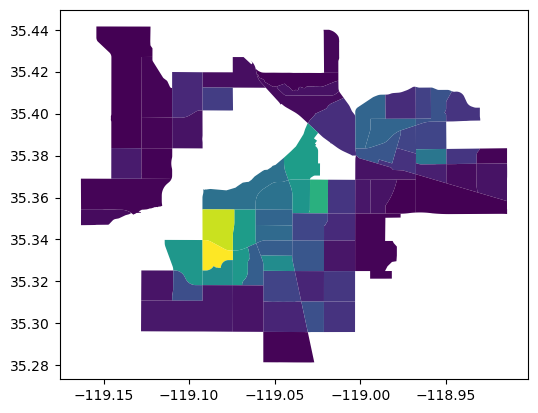

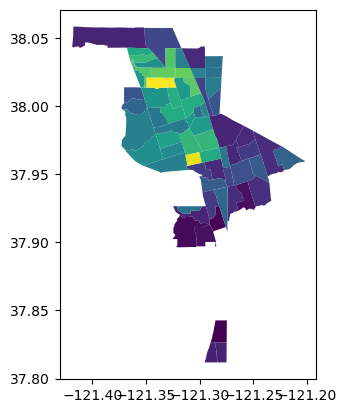

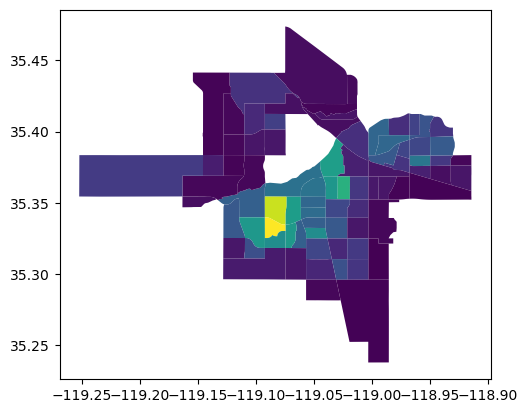

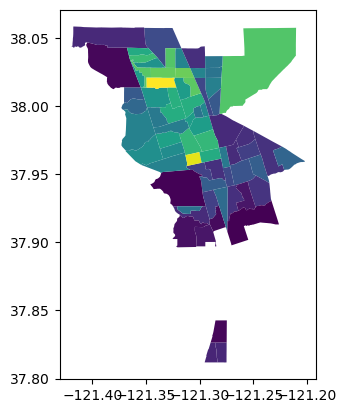

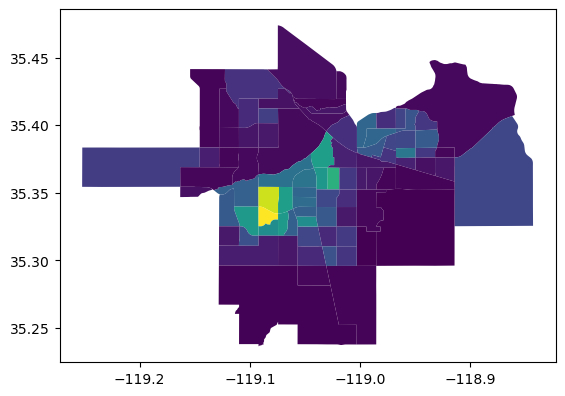

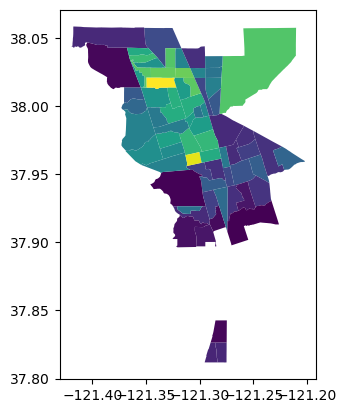

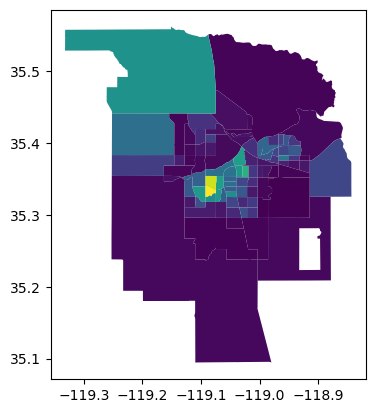

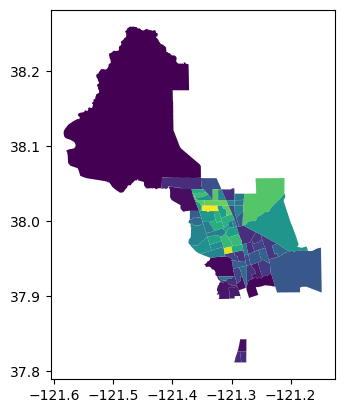

In [14]:
#test out a few filters for Population on three cities in the CV: Stockton, Bakersfield, and Redding
#numbers from https://www2.census.gov/geo/pdfs/reference/ua/Defining_Rural.pdf
#https://www.census.gov/programs-surveys/geography/guidance/geo-areas/urban-rural/ua-facts.html

#typical urban:
canopymap[(canopymap.density >1000) & (canopymap.NAME == "Bakersfield, CA")].plot(column = 'Canopy_Per')
#note Bakersfield has no tracts with density over 400
canopymap[(canopymap.density >1000) & (canopymap.NAME == "Stockton, CA")].plot(column = 'Canopy_Per')

#low density urban/suburban + urban cutoff for census first pass
canopymap[(canopymap.density >390) & (canopymap.NAME == "Bakersfield, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >390) & (canopymap.NAME == "Stockton, CA")].plot(column = 'Canopy_Per')

#capture much of city, cutoff for census second pass
canopymap[(canopymap.density >200) & (canopymap.NAME == "Bakersfield, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >200) & (canopymap.NAME == "Stockton, CA")].plot(column = 'Canopy_Per')

canopymap[(canopymap.density >5) & (canopymap.NAME == "Bakersfield, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >5) & (canopymap.NAME == "Stockton, CA")].plot(column = 'Canopy_Per')


#### Idea: run longevity analysis using all tracts and using >50 pop density tracts

<Axes: >

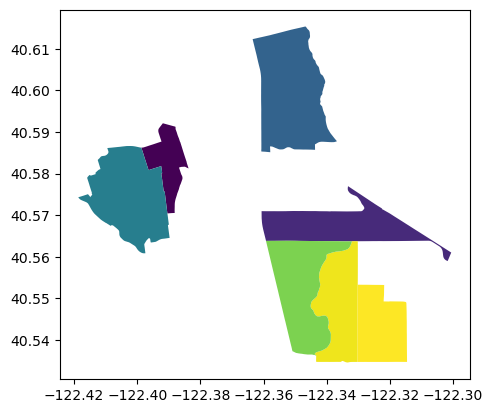

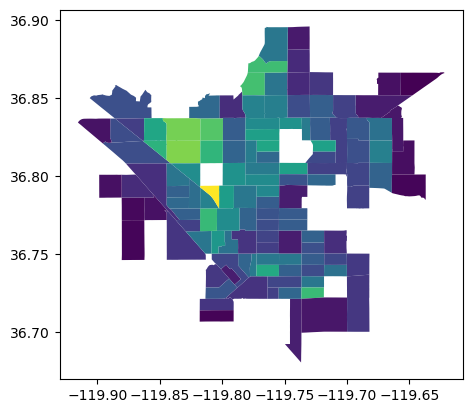

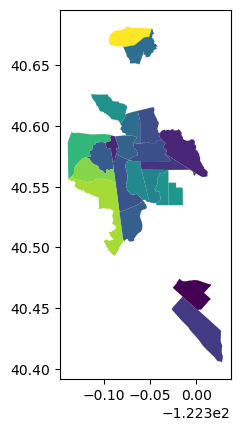

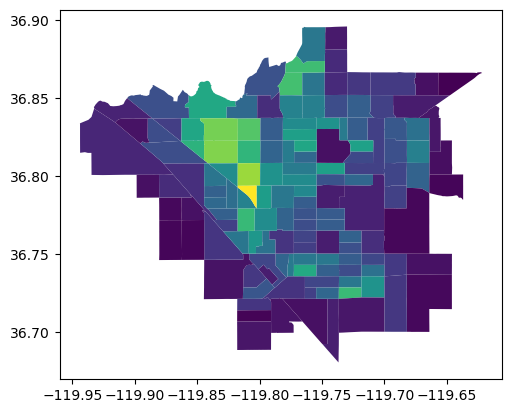

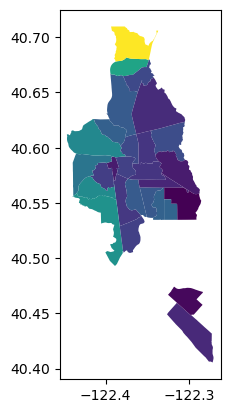

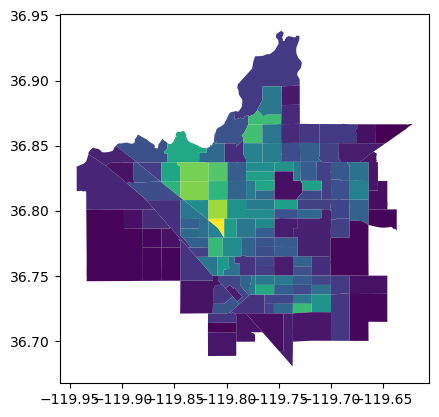

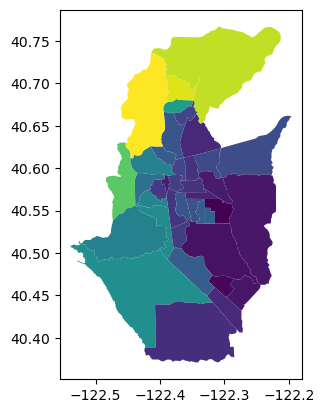

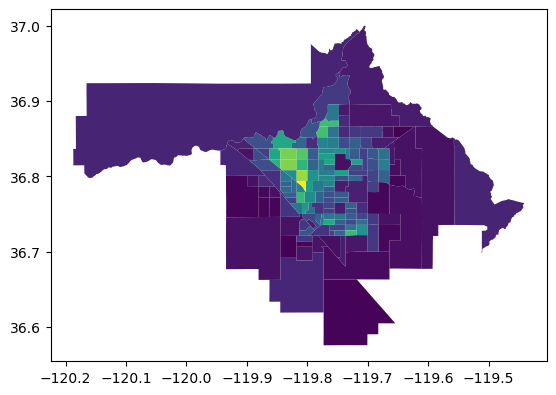

In [82]:
canopymap[(canopymap.density >1000) & (canopymap.NAME == "Redding, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >1000) & (canopymap.NAME == "Fresno, CA")].plot(column = 'Canopy_Per')

#low density urban/suburban + urban
canopymap[(canopymap.density >390) & (canopymap.NAME == "Redding, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >390) & (canopymap.NAME == "Fresno, CA")].plot(column = 'Canopy_Per')

#capture much of city
canopymap[(canopymap.density >200) & (canopymap.NAME == "Redding, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >200) & (canopymap.NAME == "Fresno, CA")].plot(column = 'Canopy_Per')

#capture most of city
canopymap[(canopymap.density >5) & (canopymap.NAME == "Redding, CA")].plot(column = 'Canopy_Per')
canopymap[(canopymap.density >5) & (canopymap.NAME == "Fresno, CA")].plot(column = 'Canopy_Per')

In [84]:
longev = pd.read_csv('CA_lifeexpectancy.CSV')
longev['GEOID'] =longev['Tract ID'].apply(str)
longev.GEOID = longev.GEOID.str.zfill(11)
#longev.TRACT2KX =longev.TRACT2KX.apply(str)
#longev.STATE2KX =longev.STATE2KX.apply(str)

#longev['GEOID'] = '0'+ longev.STATE2KX+ longev.CNTY2KX + longev.TRACT2KX

In [90]:
canopylong = canopymap.merge(longev, how = 'left', on = 'GEOID')

<Axes: >

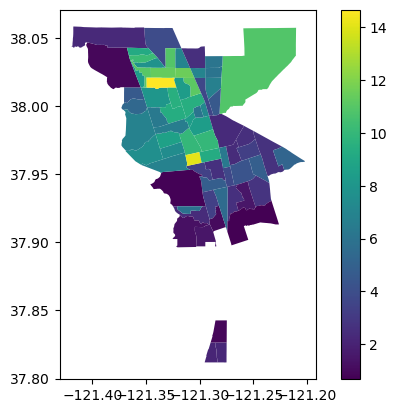

In [284]:
canopylong[(canopylong.density >390)&(canopymap.NAME == "Stockton, CA")].plot(column = 'Canopy_Per', legend = True)


<Axes: >

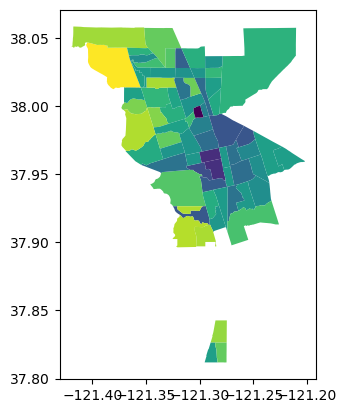

In [281]:
canopylong[(canopylong.density >390)&(canopylong.NAME == "Stockton, CA")].plot(column = 'e(0)')

In [280]:
canopylong.columns

Index(['GEOID', 'Canopy_Per', 'NAME', 'geometry', 'Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree', 'Poverty',
       'Unemployed', 'assistance', 'density', 'e(0)', 'White', 'Black',
       'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance'],
      dtype='object')

In [91]:
canopylong.columns

Index(['Ar_pixel', 'AWATER', 'GEOID', 'Canopy_Per', 'ALAND', 'NAME',
       'geometry', 'Unnamed: 0', 'Population', 'Median_household_income',
       'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Total__Population_25_and_over', 'Total_Regular_high_school_diploma',
       'Total_GED_or_alternative_credential',
       'Total_Some_college_less_than_1_year',
       'Total_Some_college_1_or_more_years_no_degree', 'Associates',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Total_With_earnings', 'Total_No_earnings',
       'Total_With_Social_Security_income', 'Total_No_Social_Security_income',
       'Total__Households.1', 'Total_With_Supplemental_Security_Income_(SSI)',
       'Total_With_public_assistance_income',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Total__Race', 'Total_Population', 'Total_White_alone',
       'Total_Blac

In [92]:
canopylong.drop(['Tract ID', 'STATE2KX', 'CNTY2KX', 'TRACT2KX', 'se(e(0))', 'Abridged life table flag', 'Total_Population', 'Total__Households.1','Ar_pixel', "AWATER", 'ALAND','Total__Population_25_and_over', 'Total_Regular_high_school_diploma',
       'Total_GED_or_alternative_credential','Total_Some_college_less_than_1_year','Total_Some_college_1_or_more_years_no_degree', 'Associates', 'Unnamed: 0', 'state', 'county', 'tract'], axis = 1, inplace = True)

In [93]:
canopylong.columns

Index(['GEOID', 'Canopy_Per', 'NAME', 'geometry', 'Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Total_With_earnings', 'Total_No_earnings',
       'Total_With_Social_Security_income', 'Total_No_Social_Security_income',
       'Total_With_Supplemental_Security_Income_(SSI)',
       'Total_With_public_assistance_income',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Total__Race', 'Total_White_alone',
       'Total_Black_or_African_American_alone',
       'Total_American_Indian_and_Alaska_Native_alone', 'Total_Asian_alone',
       'Total_Native_Hawaiian_and_Other_Pacific_Islander_alone',
       'Total_Some_other_race_alone', 'Total_Two_or_more_races',
       'Working_hours', 'Gini_index', 'percent_degree', 'Poverty',
       'Unemployed', 'assista

In [94]:
#convert racial category numbers into percents
canopylong['White'] = canopylong.Total_White_alone/canopylong.Total__Race
canopylong['Black'] = canopylong.Total_Black_or_African_American_alone/canopylong.Total__Race
canopylong['AmerIndian'] = canopylong.Total_American_Indian_and_Alaska_Native_alone/canopylong.Total__Race
canopylong['PacIslander'] = canopylong.Total_Native_Hawaiian_and_Other_Pacific_Islander_alone/canopylong.Total__Race
canopylong['Asian'] = canopylong.Total_Asian_alone/canopylong.Total__Race
canopylong['Other'] = canopylong.Total_Some_other_race_alone/canopylong.Total__Race
canopylong['Biracial'] = canopylong.Total_Two_or_more_races/canopylong.Total__Race

#convert assistance and earning categories into percents
canopylong['Households_without_earnings'] = canopylong.Total_No_earnings/canopylong.Total__Households
canopylong['Households_with_SSI'] = canopylong.Total_With_Social_Security_income/canopylong.Total__Households
canopylong['Households_with_SupSI'] = canopylong['Total_With_Supplemental_Security_Income_(SSI)']/canopylong.Total__Households
canopylong['Households_with_public_assistance'] = canopylong.Total_With_public_assistance_income/canopylong.Total__Households

canopylong.drop(['Total_White_alone',
       'Total_Black_or_African_American_alone',
       'Total_American_Indian_and_Alaska_Native_alone', 'Total_Asian_alone',
       'Total_Native_Hawaiian_and_Other_Pacific_Islander_alone',
       'Total_Some_other_race_alone', 'Total_Two_or_more_races', 'Total_With_earnings', 'Total_No_earnings',
       'Total_With_Social_Security_income', 'Total_No_Social_Security_income',
       'Total_With_Supplemental_Security_Income_(SSI)',
       'Total_With_public_assistance_income', 'Total__Race'], axis = 1, inplace = True)

In [95]:
canopylong.columns

Index(['GEOID', 'Canopy_Per', 'NAME', 'geometry', 'Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree', 'Poverty',
       'Unemployed', 'assistance', 'density', 'e(0)', 'White', 'Black',
       'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance'],
      dtype='object')

In [ ]:
canopylong[canopylong.dropna(subset = 'e(0)')]

In [204]:
canopylong.dropna(subset = 'e(0)').isna().sum()

GEOID                                                                                0
Canopy_Per                                                                           0
NAME                                                                                 0
geometry                                                                             0
Population                                                                           0
Median_household_income                                                              0
Median_gross_rent                                                                    4
Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)         0
Aggregate_income_deficit_in_the_past_12_months                                     140
Total__Households                                                                    0
Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)      1
Working_hours                              

In [24]:
from scipy import stats
import scipy.stats.distributions as dist
from sklearn.impute import KNNImputer
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [125]:
urb = canopylong[canopylong.density >390].copy()
urb.dropna(subset = ['e(0)','Canopy_Per'],inplace = True)
urb.reset_index(inplace = True)
urb = urb[['e(0)','Canopy_Per','Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree',
       'Poverty', 'Unemployed', 'assistance', 'density', 'White',
       'Black', 'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance']]



In [126]:
imputer = KNNImputer(n_neighbors=5)
imputed = imputer.fit_transform(urb)
urb_imp = pd.DataFrame(imputed, columns = urb.columns)

In [149]:
urb_imp.columns

Index(['e(0)', 'Canopy_Per', 'Population', 'Median_household_income',
       'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree', 'Poverty',
       'Unemployed', 'assistance', 'density', 'White', 'Black', 'AmerIndian',
       'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance'],
      dtype='object')

In [137]:
#pearson correlations to find top
forcorr = ['Canopy_Per','Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree',
       'Poverty', 'Unemployed', 'assistance', 'density', 'White',
       'Black', 'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance']

corrlist = []
plist = []
for i in forcorr:
    corri = stats.pearsonr(urb[(urb[i].notna()) & (urb['e(0)'].notna())]['e(0)'], urb[(urb[i].notna()) & (urb['e(0)'].notna())][i])
    corrlist.append(corri[0])
    plist.append(corri[1])

#make a dataframe to display correlations

corrs_with_longevity = pd.DataFrame(list(zip(forcorr, corrlist, plist)))
corrs_with_longevity.columns = ['feature', 'Pearsonsr', 'p-value']
corrs_with_longevity.sort_values(by = 'Pearsonsr')


,feature,Pearsonsr,p-value
11,Poverty,-0.618708,6.364357e-99
24,Households_with_SupSI,-0.570762,3.724573e-81
13,assistance,-0.509644,2.326907e-62
25,Households_with_public_assistance,-0.509644,2.326907e-62
12,Unemployed,-0.455296,1.408011e-48
20,Other,-0.384842,4.675177e-34
22,Households_without_earnings,-0.306396,1.407292e-21
17,AmerIndian,-0.252953,5.519986e-15
16,Black,-0.244736,4.271249e-14
9,Gini_index,-0.217100,2.434202e-11


In [235]:
urb_imp.columns

Index(['e(0)', 'Canopy_Per', 'Population', 'Median_household_income',
       'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree', 'Poverty',
       'Unemployed', 'assistance', 'density', 'White', 'Black', 'AmerIndian',
       'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance'],
      dtype='object')

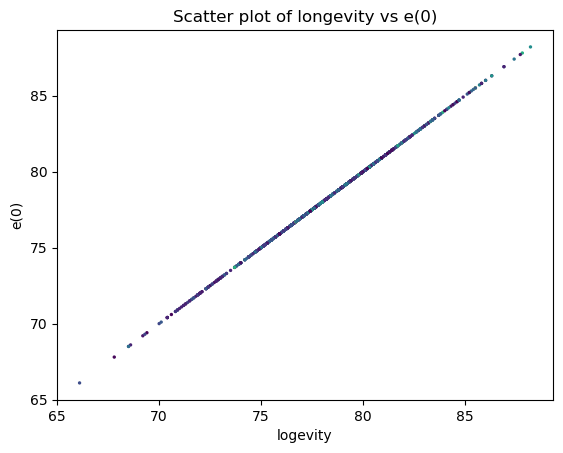

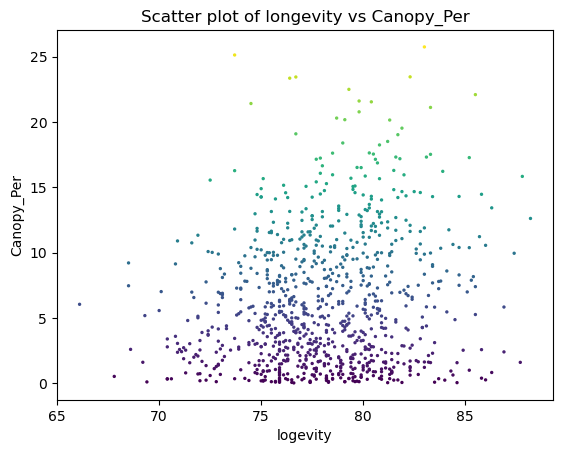

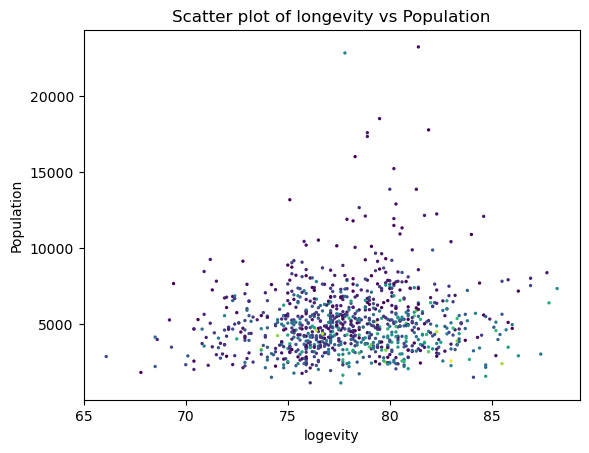

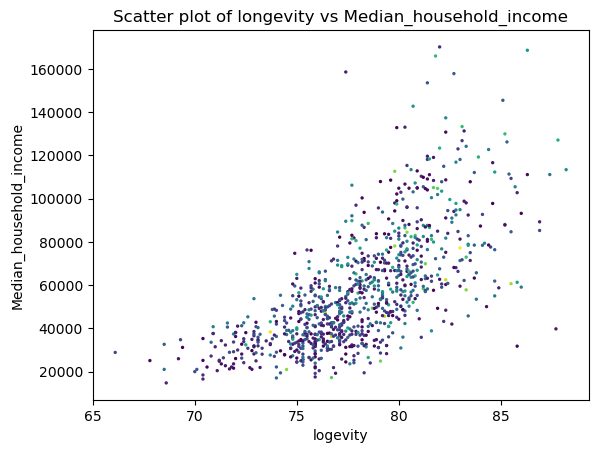

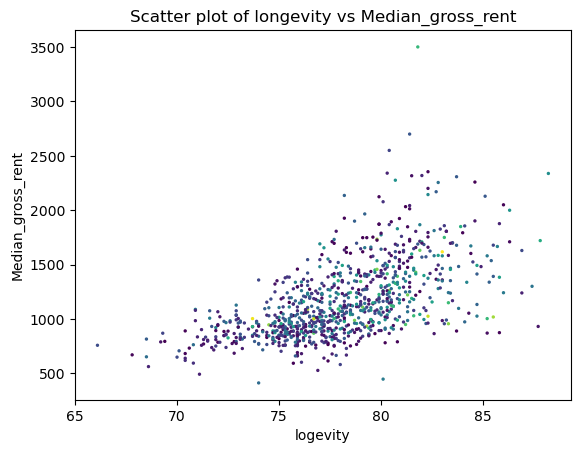

...

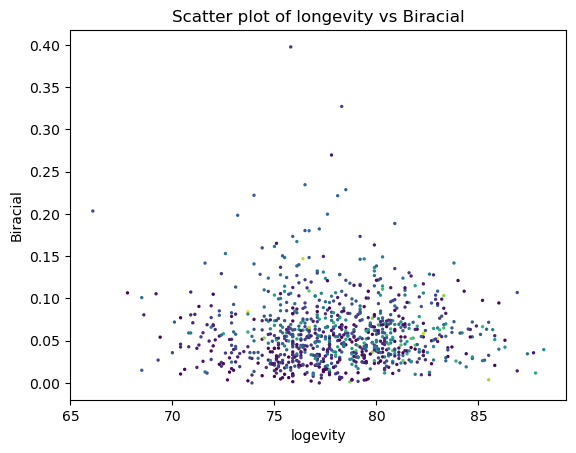

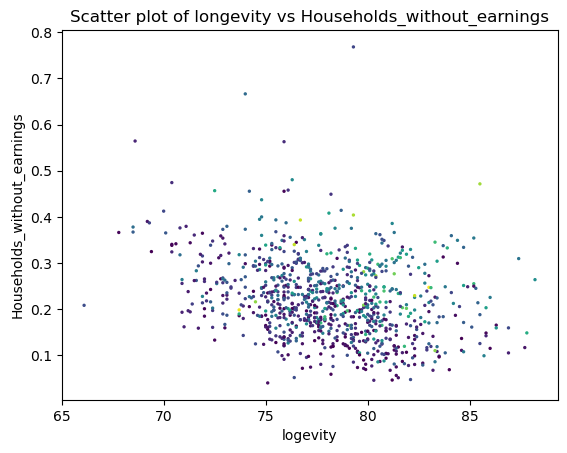

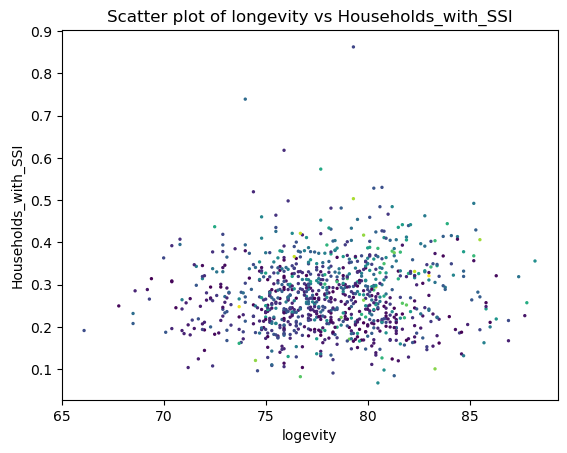

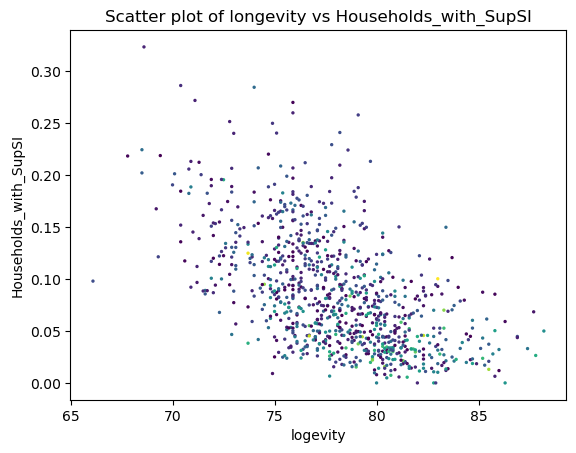

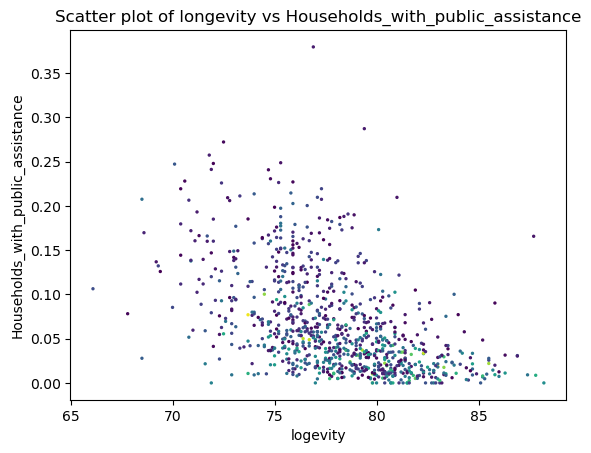

In [247]:
for i in urb_imp.columns:
    plt.figure()
    plt.scatter(urb_imp['e(0)'], urb_imp[i], c = urb_imp['Canopy_Per'], s = 2)
    plt.title(f'Scatter plot of longevity vs {i}')
    plt.xlabel('longevity')
    plt.ylabel(i)
    plt.show()
    

In [253]:
urb_imp.Canopy_Per.describe()

count    926.000000
mean       6.164360
std        4.970595
min        0.017574
25%        2.086412
50%        5.114328
75%        9.422983
max       25.745677
Name: Canopy_Per, dtype: float64

<Figure size 640x480 with 0 Axes>

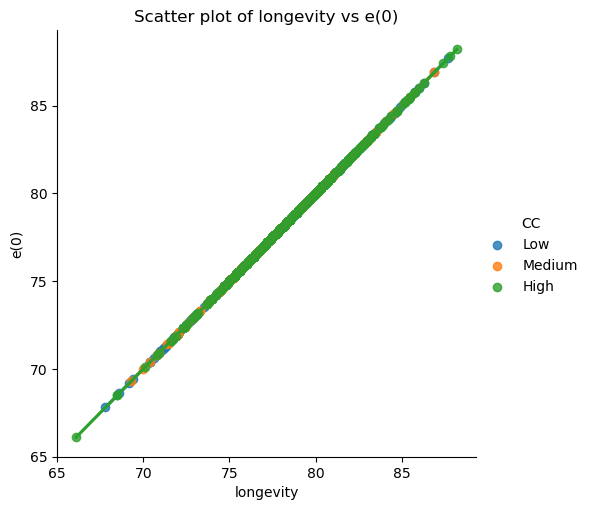

<Figure size 640x480 with 0 Axes>

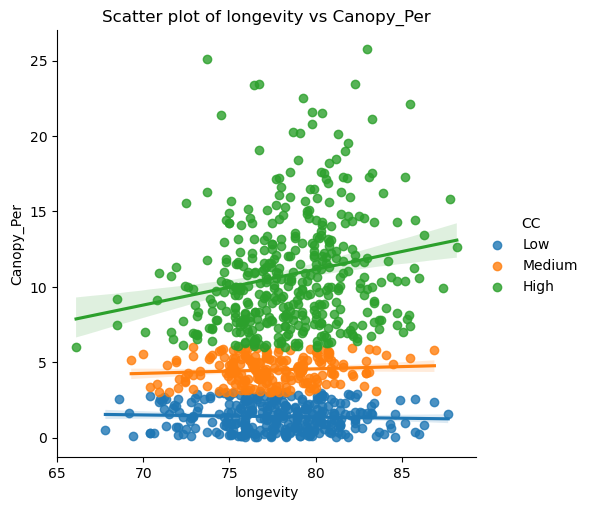

<Figure size 640x480 with 0 Axes>

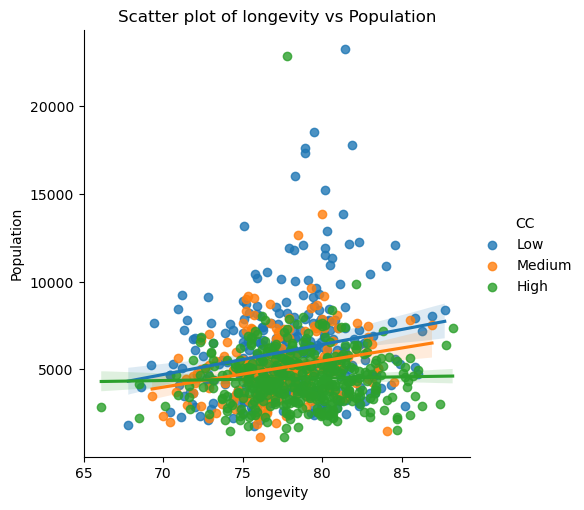

<Figure size 640x480 with 0 Axes>

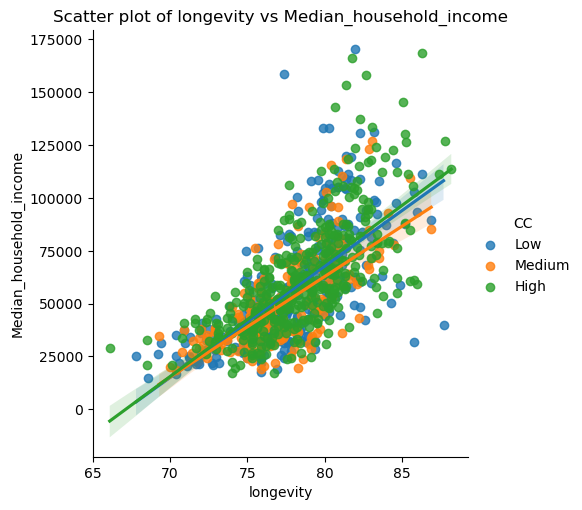

<Figure size 640x480 with 0 Axes>

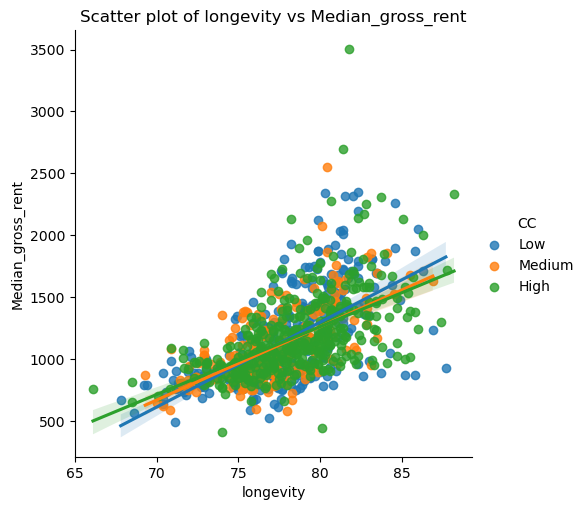

<Figure size 640x480 with 0 Axes>

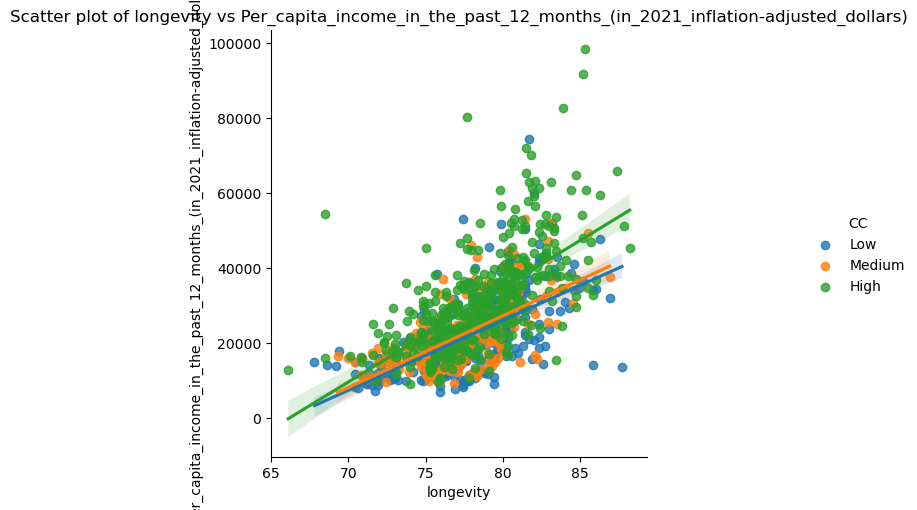

<Figure size 640x480 with 0 Axes>

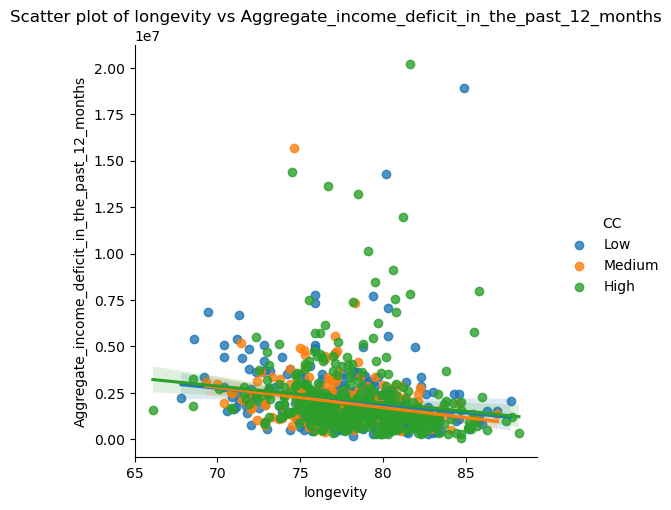

<Figure size 640x480 with 0 Axes>

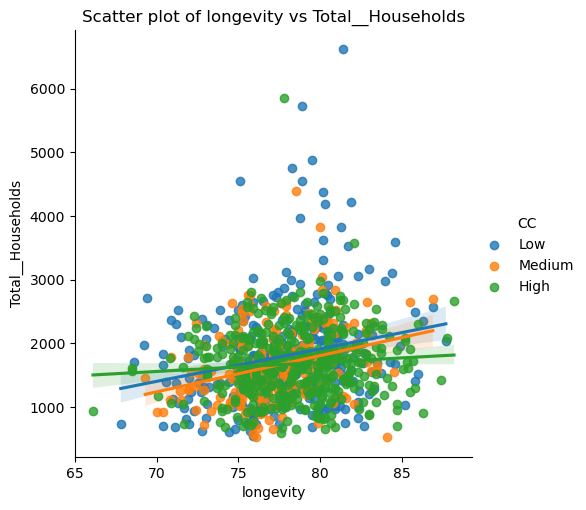

<Figure size 640x480 with 0 Axes>

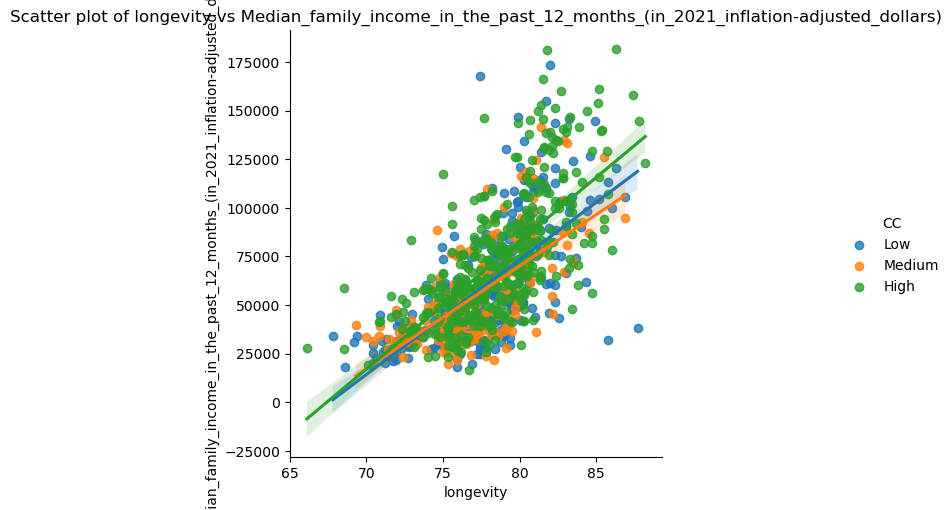

<Figure size 640x480 with 0 Axes>

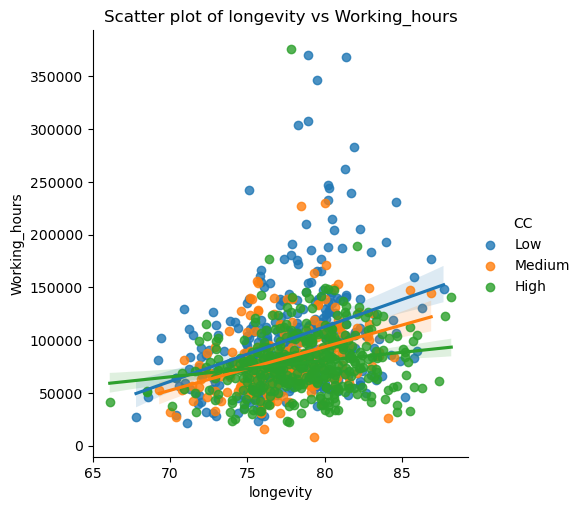

<Figure size 640x480 with 0 Axes>

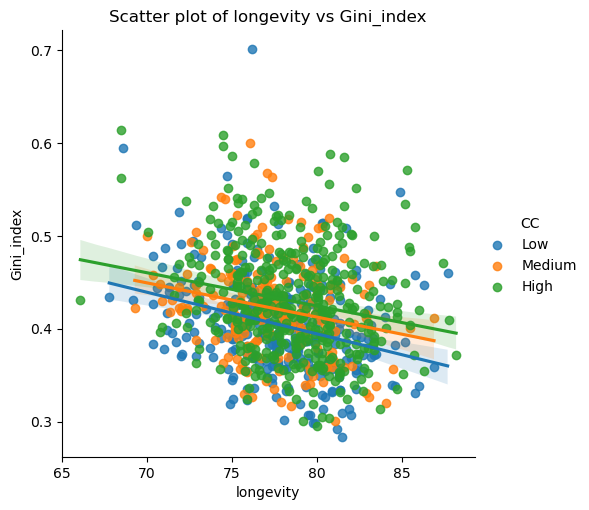

<Figure size 640x480 with 0 Axes>

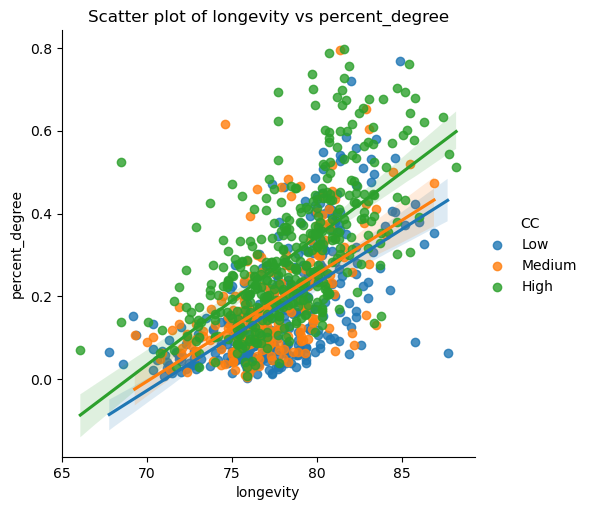

<Figure size 640x480 with 0 Axes>

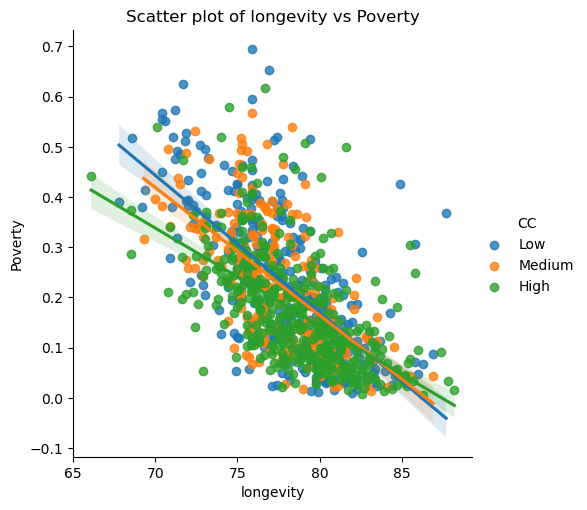

<Figure size 640x480 with 0 Axes>

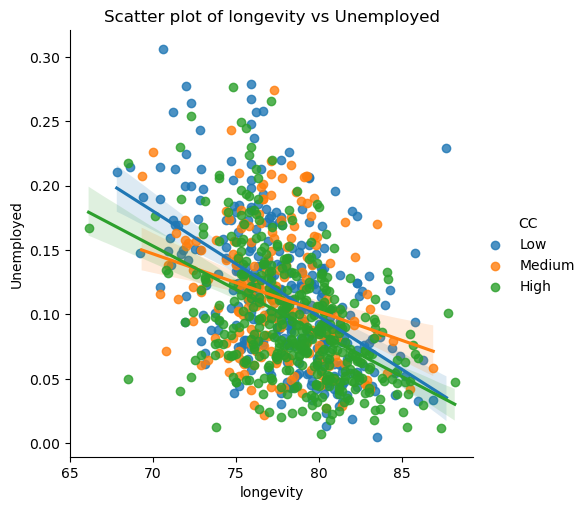

<Figure size 640x480 with 0 Axes>

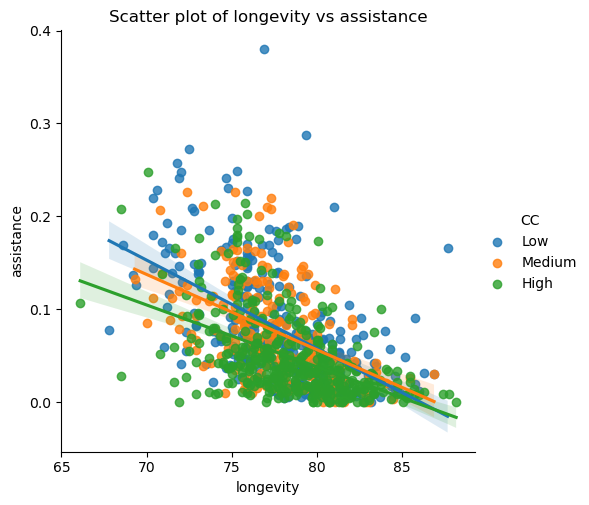

<Figure size 640x480 with 0 Axes>

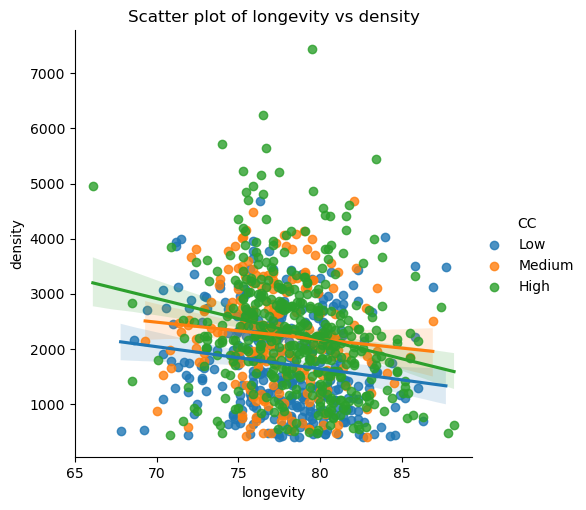

<Figure size 640x480 with 0 Axes>

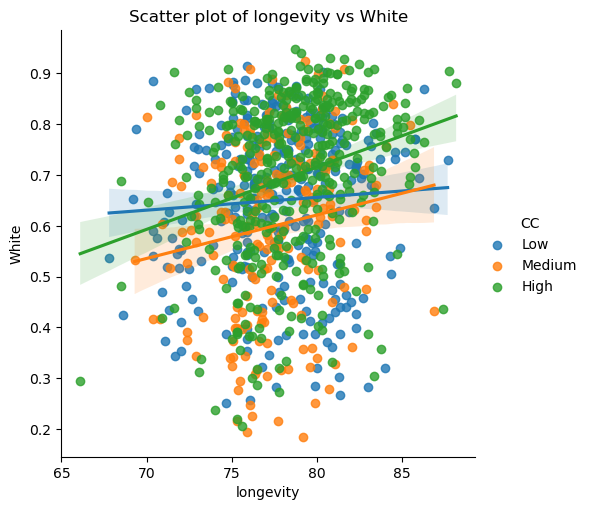

<Figure size 640x480 with 0 Axes>

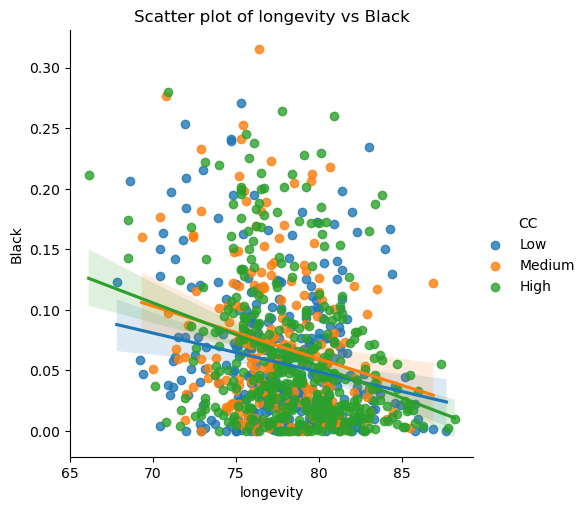

<Figure size 640x480 with 0 Axes>

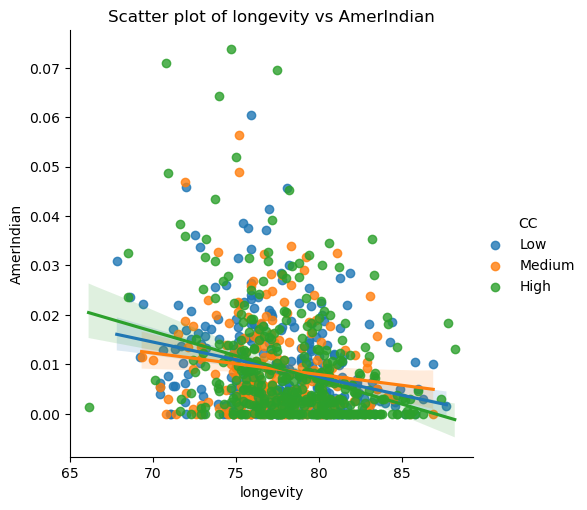

<Figure size 640x480 with 0 Axes>

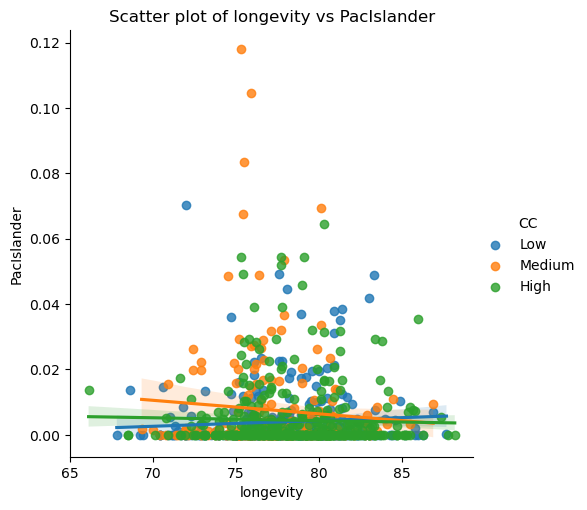

<Figure size 640x480 with 0 Axes>

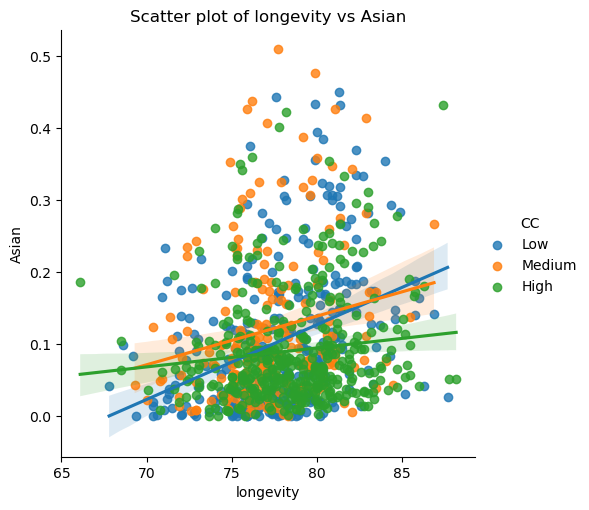

<Figure size 640x480 with 0 Axes>

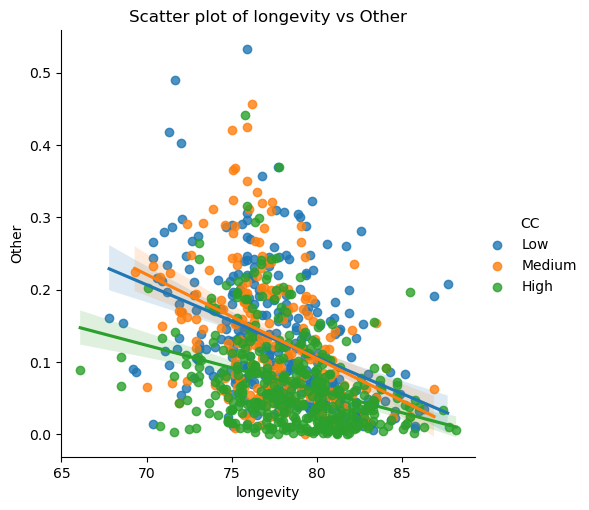

<Figure size 640x480 with 0 Axes>

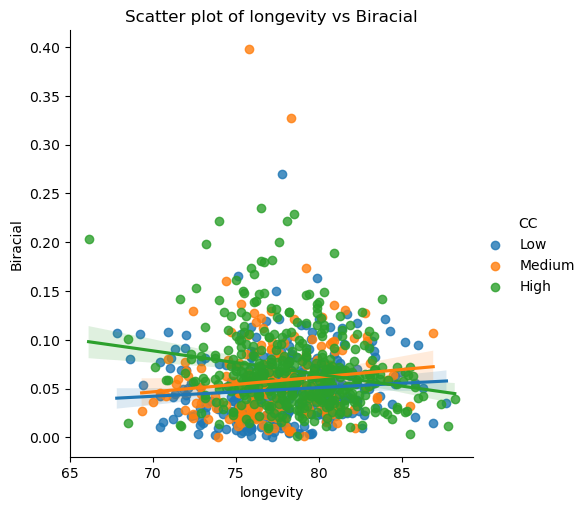

<Figure size 640x480 with 0 Axes>

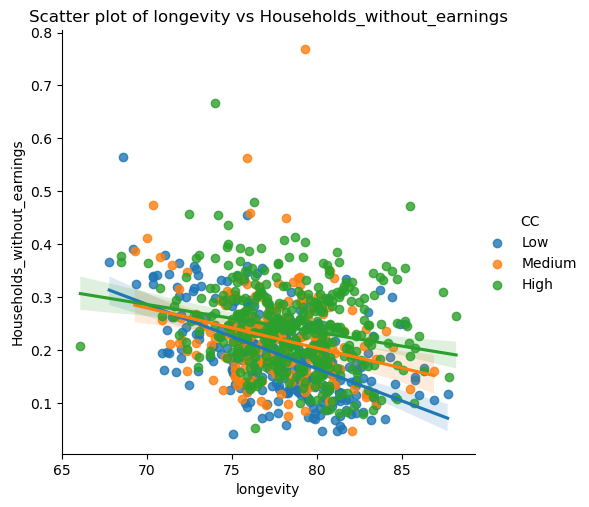

<Figure size 640x480 with 0 Axes>

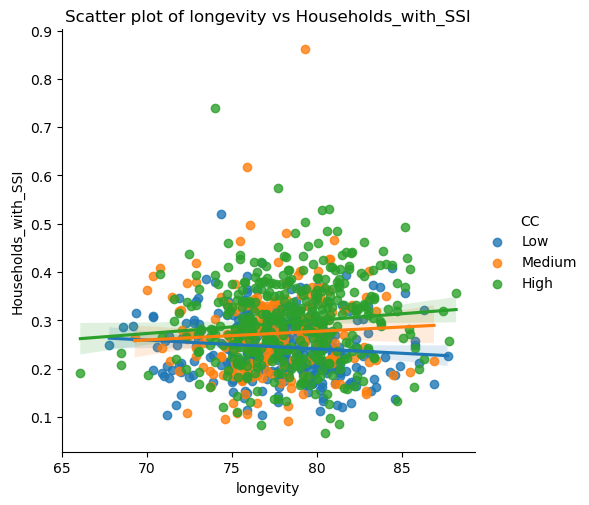

<Figure size 640x480 with 0 Axes>

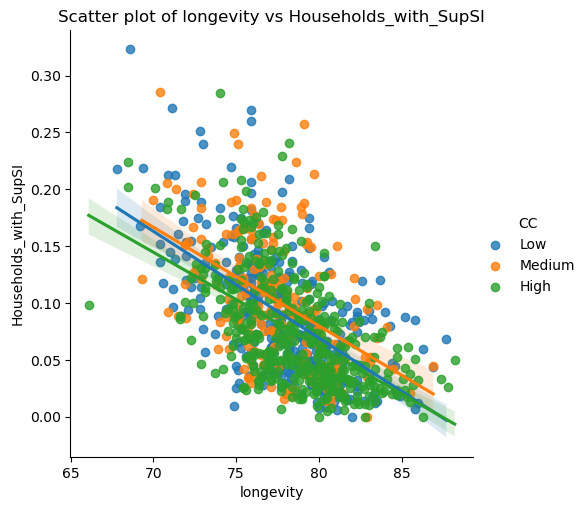

<Figure size 640x480 with 0 Axes>

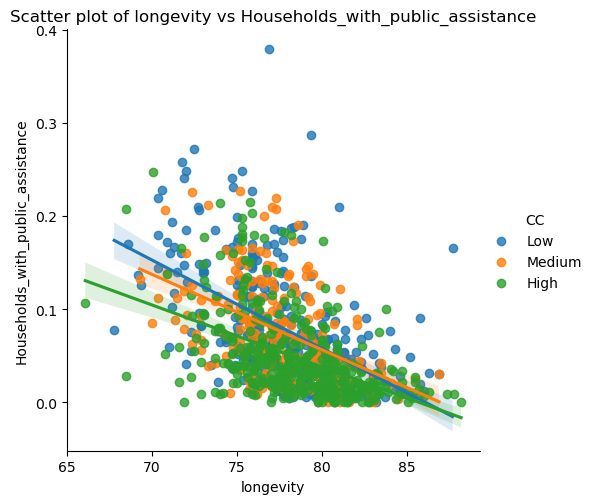

ValueError: could not convert string to float: 'Low'

<Figure size 640x480 with 0 Axes>

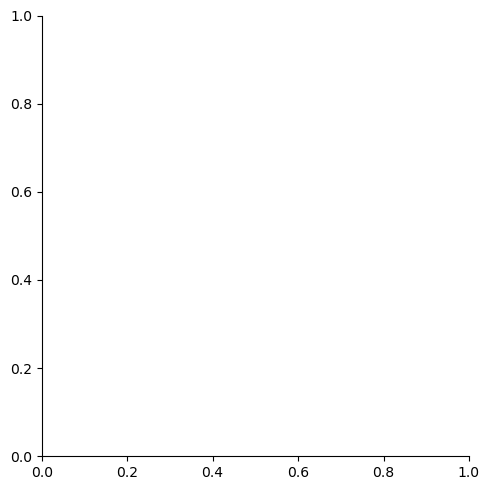

In [255]:
urb_impCat = urb_imp.copy()
urb_impCat['CC'] = pd.cut(x=urb_impCat['Canopy_Per'], bins=[0, 3, 6, 100], 
                     labels=['Low', 'Medium', 'High'])

for i in urb_impCat.columns:
    plt.figure()
    sns.lmplot(x = 'e(0)', y = i, data = urb_impCat, hue = 'CC')
    plt.title(f'Scatter plot of longevity vs {i}')
    plt.xlabel('longevity')
    plt.ylabel(i)
    plt.show()

<Figure size 640x480 with 0 Axes>

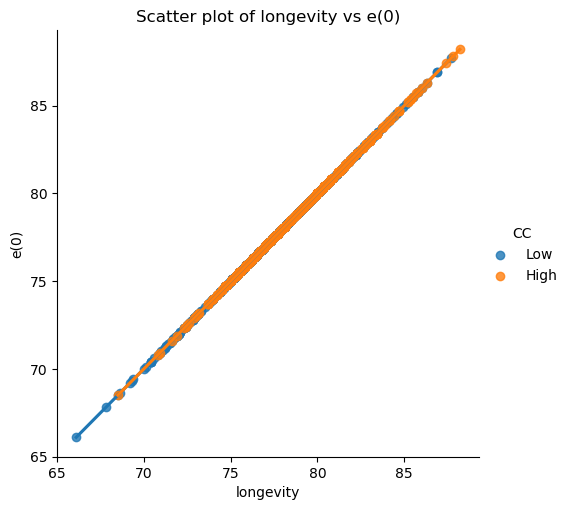

<Figure size 640x480 with 0 Axes>

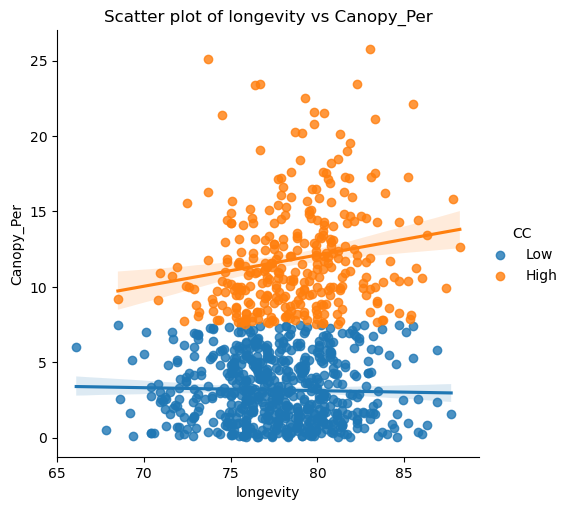

<Figure size 640x480 with 0 Axes>

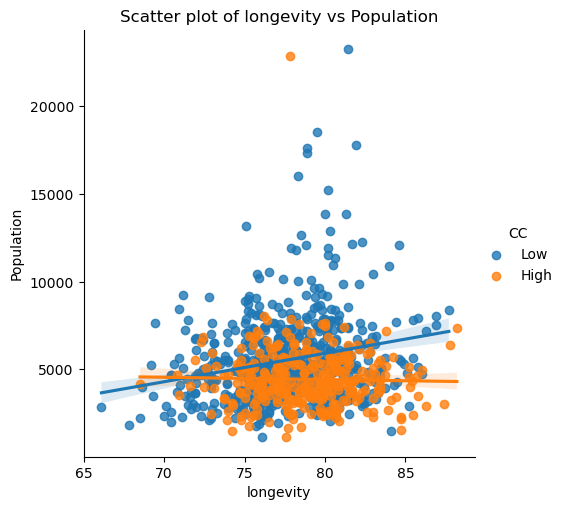

<Figure size 640x480 with 0 Axes>

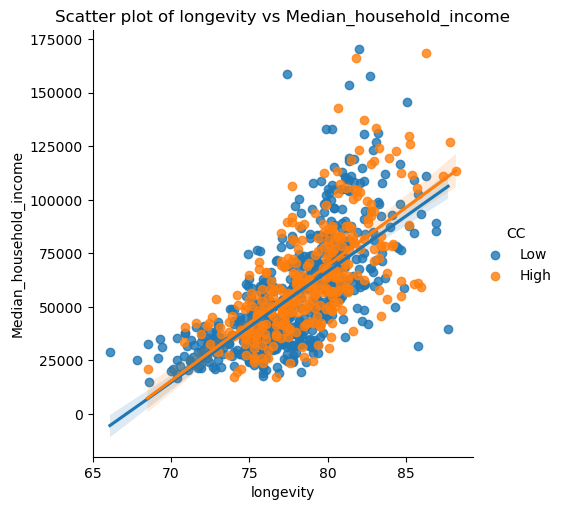

<Figure size 640x480 with 0 Axes>

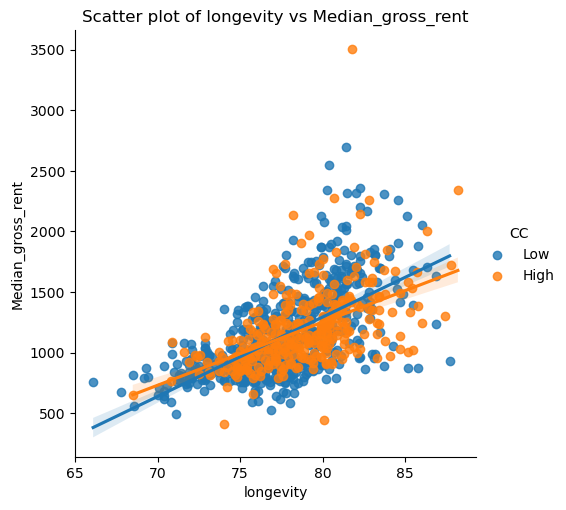

<Figure size 640x480 with 0 Axes>

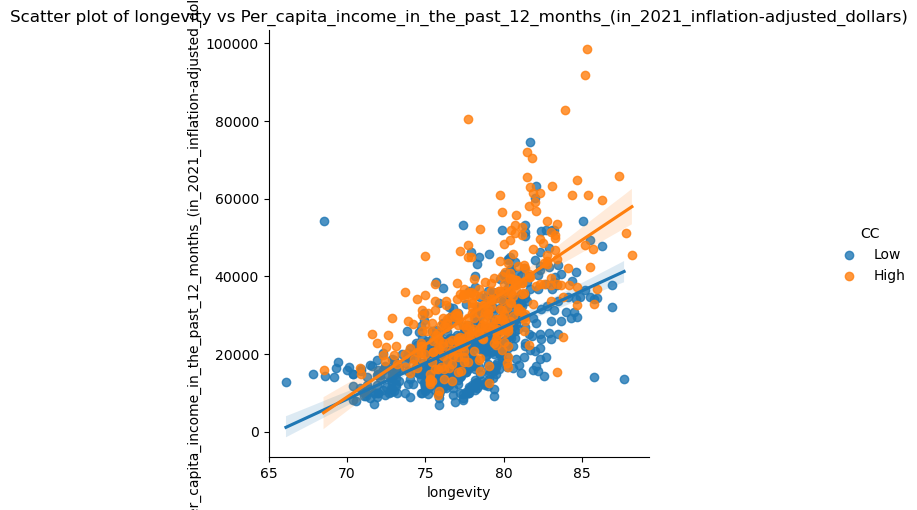

<Figure size 640x480 with 0 Axes>

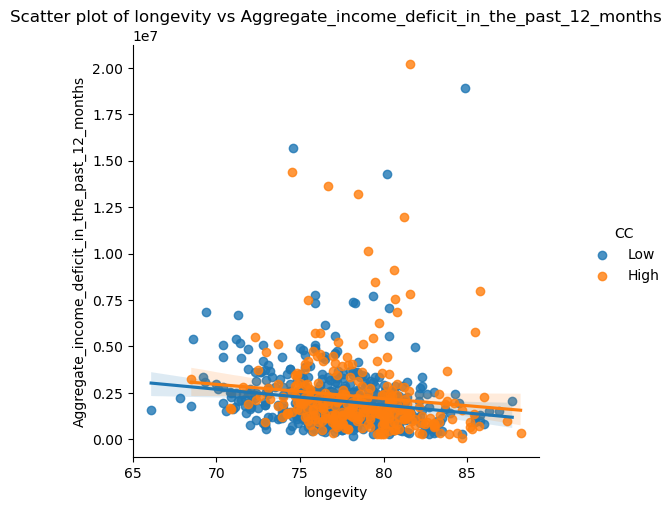

<Figure size 640x480 with 0 Axes>

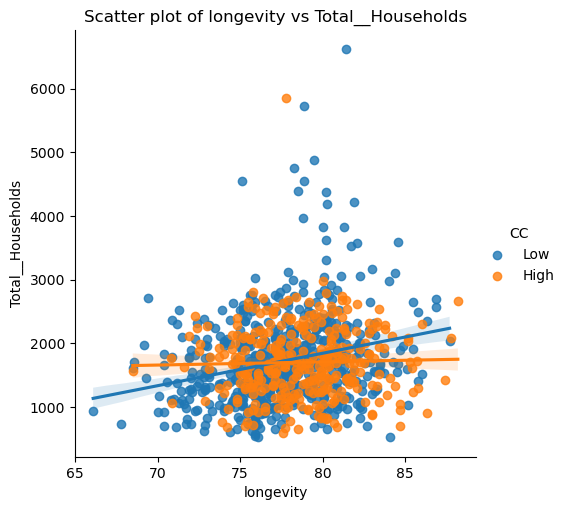

<Figure size 640x480 with 0 Axes>

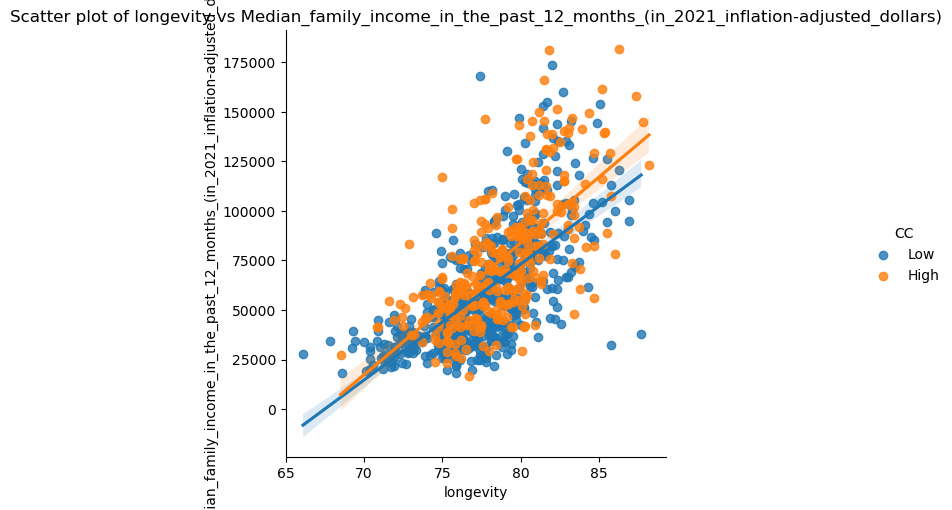

<Figure size 640x480 with 0 Axes>

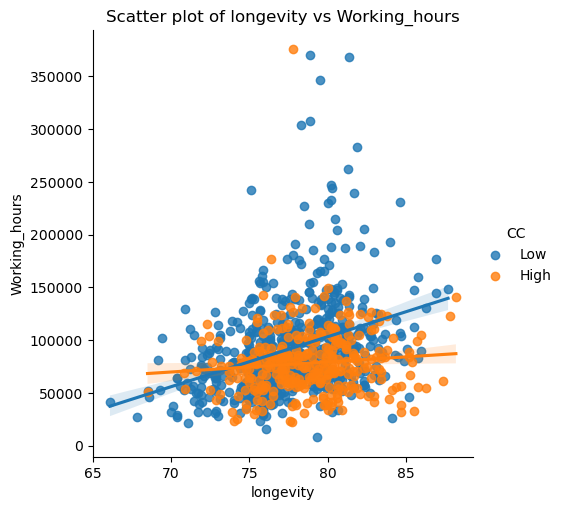

<Figure size 640x480 with 0 Axes>

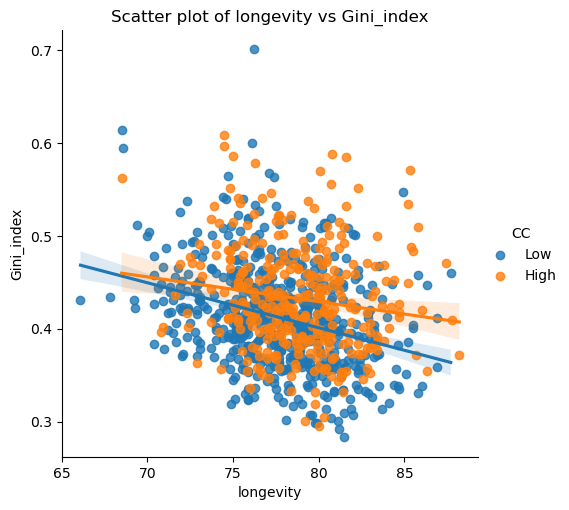

<Figure size 640x480 with 0 Axes>

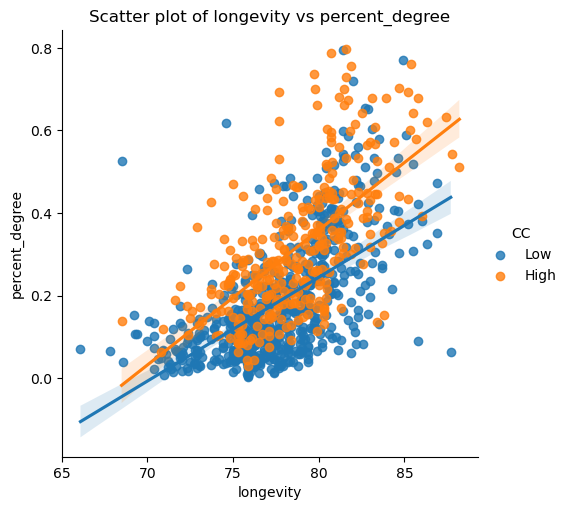

<Figure size 640x480 with 0 Axes>

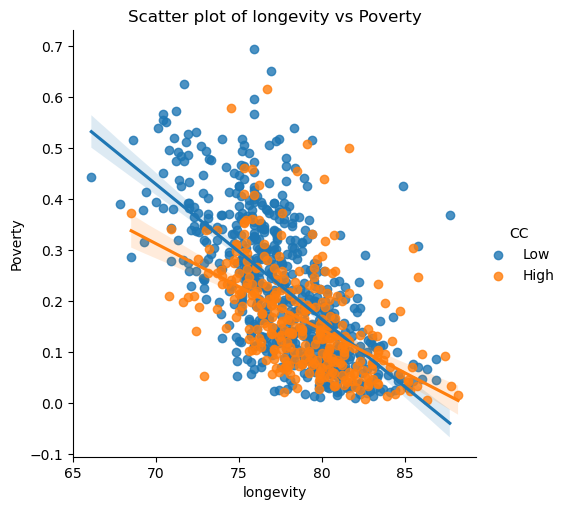

<Figure size 640x480 with 0 Axes>

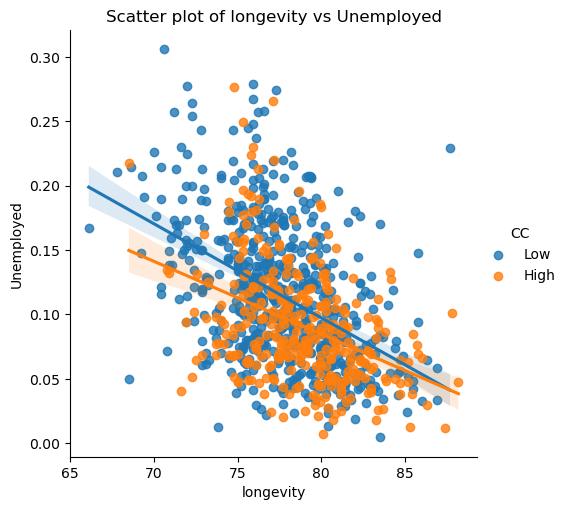

<Figure size 640x480 with 0 Axes>

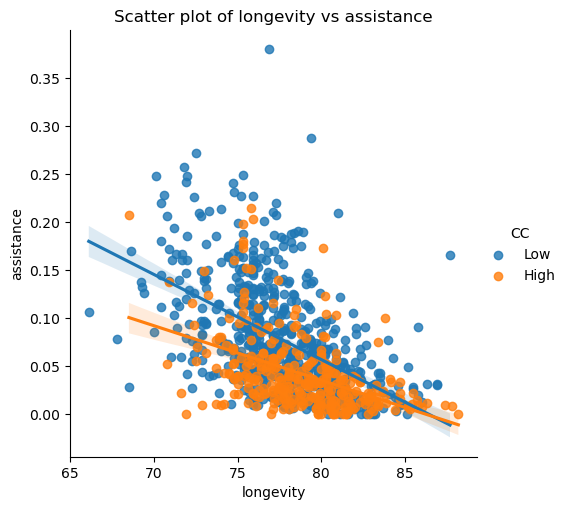

<Figure size 640x480 with 0 Axes>

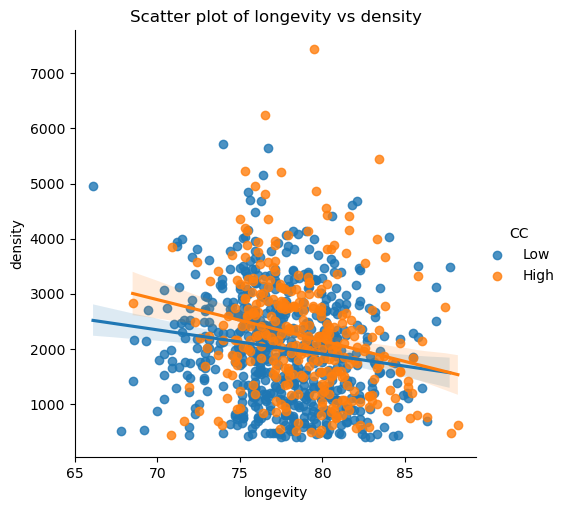

<Figure size 640x480 with 0 Axes>

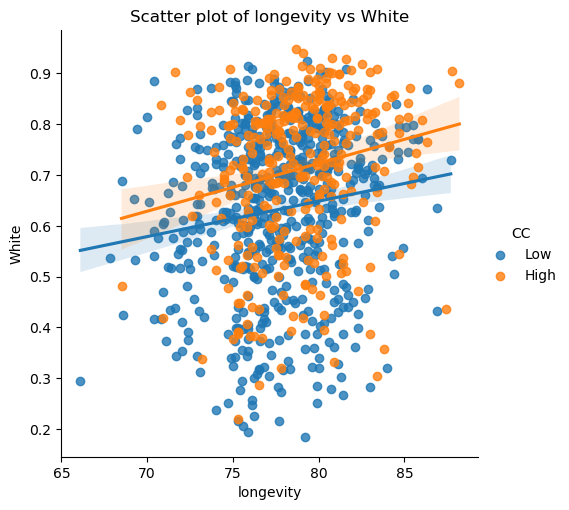

<Figure size 640x480 with 0 Axes>

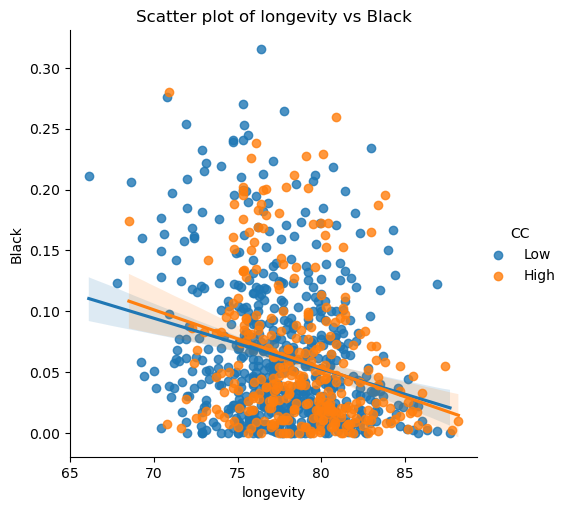

<Figure size 640x480 with 0 Axes>

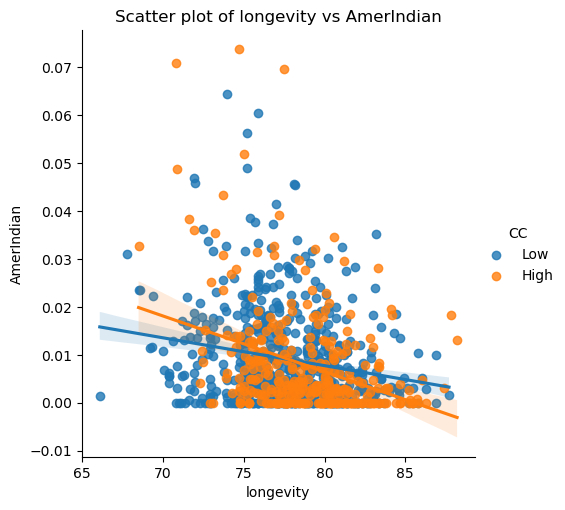

<Figure size 640x480 with 0 Axes>

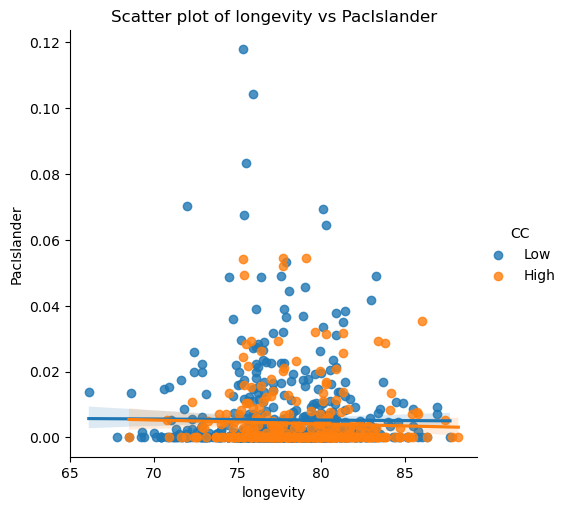

<Figure size 640x480 with 0 Axes>

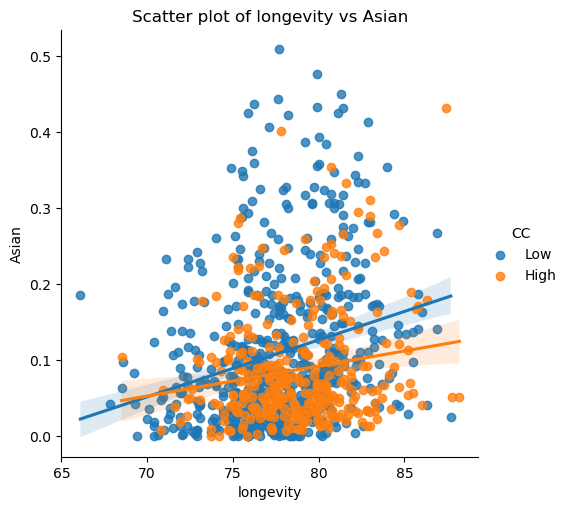

<Figure size 640x480 with 0 Axes>

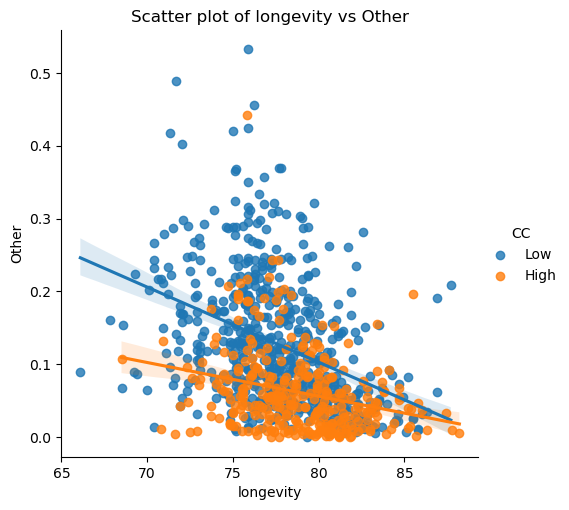

<Figure size 640x480 with 0 Axes>

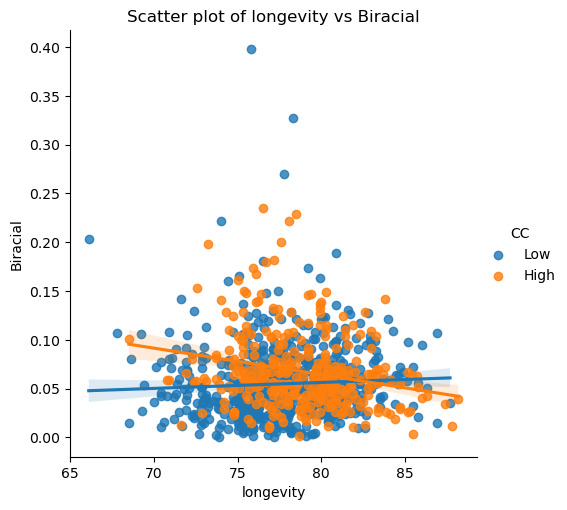

<Figure size 640x480 with 0 Axes>

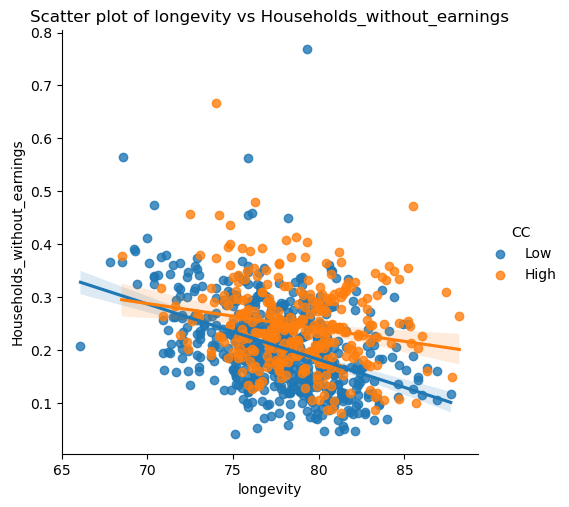

<Figure size 640x480 with 0 Axes>

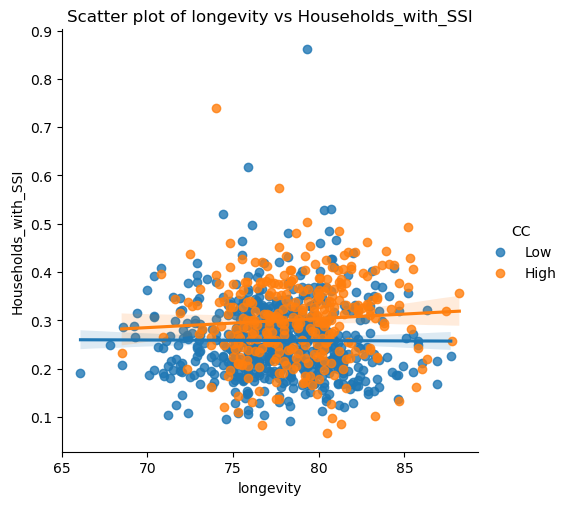

<Figure size 640x480 with 0 Axes>

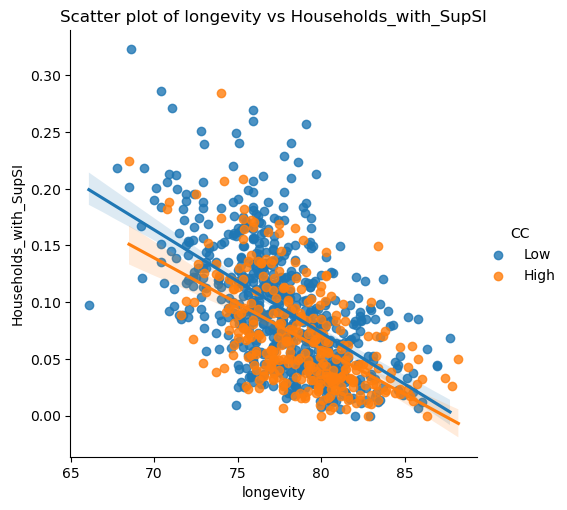

<Figure size 640x480 with 0 Axes>

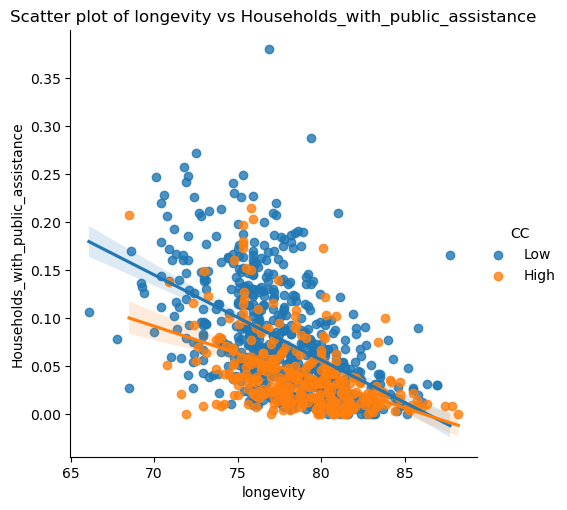

ValueError: could not convert string to float: 'Low'

<Figure size 640x480 with 0 Axes>

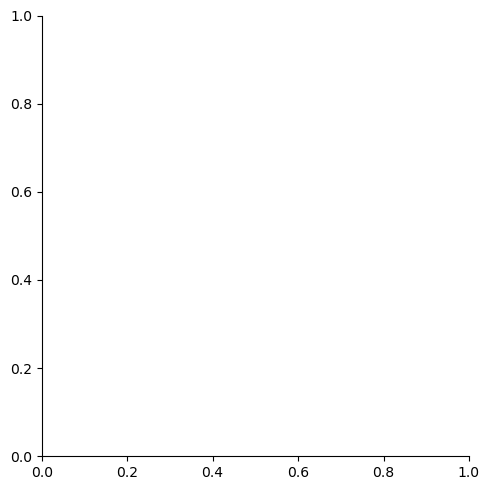

In [256]:
urb_Cat = urb.copy()
urb_Cat['CC'] = pd.cut(x=urb_Cat['Canopy_Per'], bins=[0, 7.5, 100], 
                     labels=['Low', 'High'])

for i in urb_Cat.columns:
    plt.figure()
    sns.lmplot(x = 'e(0)', y = i, data = urb_Cat, hue = 'CC')
    plt.title(f'Scatter plot of longevity vs {i}')
    plt.xlabel('longevity')
    plt.ylabel(i)
    plt.show()

In [242]:
urb_imp.Population.describe()

count      926.000000
mean      5151.679266
std       2343.342226
min       1121.000000
25%       3643.500000
50%       4787.500000
75%       6086.000000
max      23255.000000
Name: Population, dtype: float64

In [152]:
#VIF to look for overly correlated
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X_imp = urb_imp.drop('e(0)', axis = 1)

X = add_constant(X_imp)
VIF_X = pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns)

C:\Users\ariver10\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
C:\Users\ariver10\AppData\Local\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [153]:
VIF_X

const                                                                               0.000000
Canopy_Per                                                                          1.978476
Population                                                                         32.276215
Median_household_income                                                            25.383153
Median_gross_rent                                                                   4.145272
Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)       19.095701
Aggregate_income_deficit_in_the_past_12_months                                      2.263535
Total__Households                                                                  20.288503
Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)    20.712166
Working_hours                                                                      32.217965
Gini_index                                                            

C:\Users\ariver10\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\ariver10\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


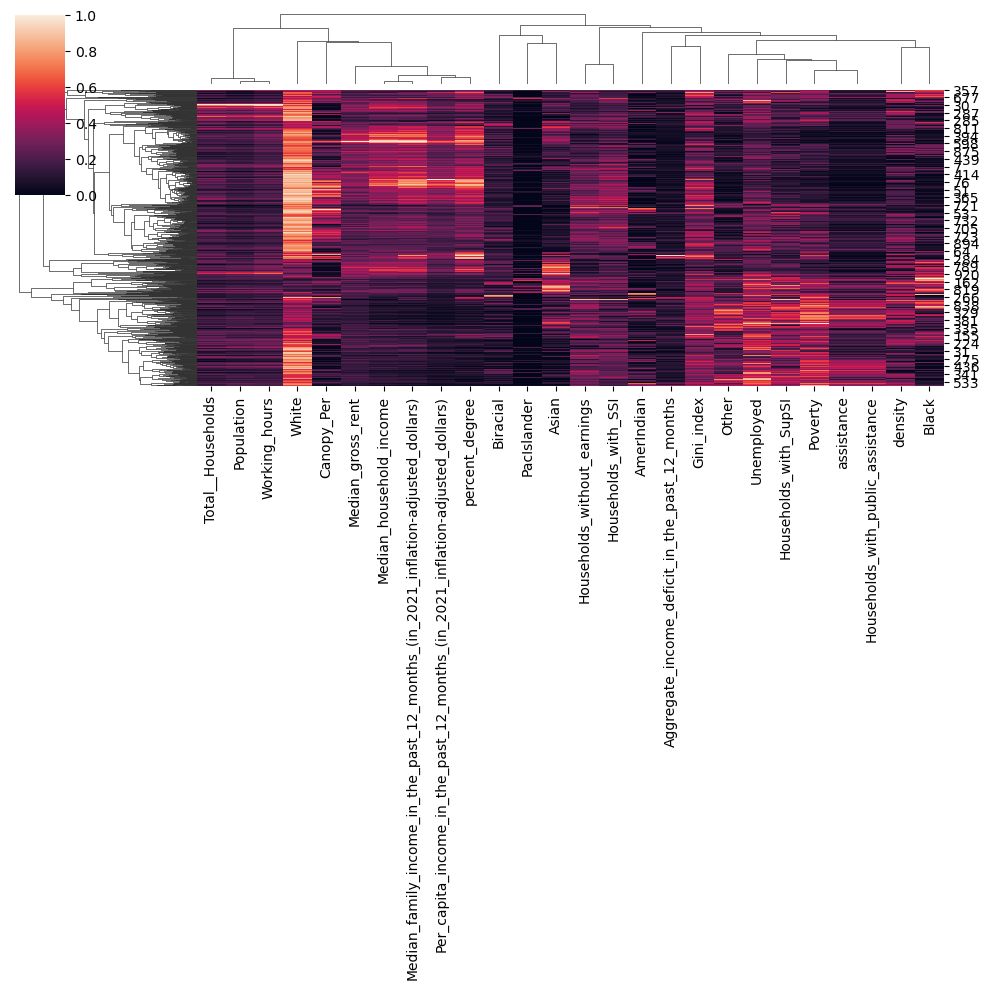

In [158]:
sns.clustermap(X_imp,
               metric="correlation",
               standard_scale=1)

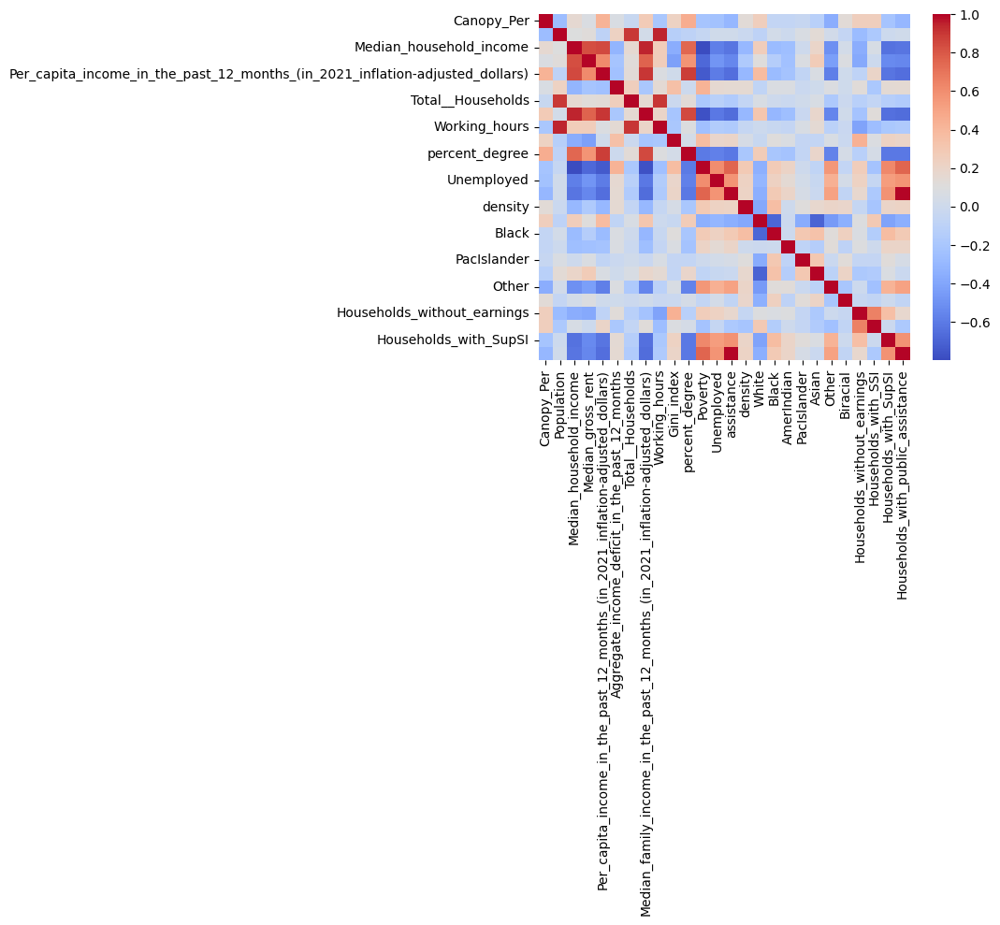

In [154]:
#overly correlated into a new dataframe to look for which to pull out (run corr heatmap)
corr_matrix = X_imp.corr()
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm")
plt.show()


In [228]:
urb_mini = urb_imp[['e(0)', 'Canopy_Per', 'Population', 'Gini_index', 'percent_degree','density', 'Black','Asian', 'Households_without_earnings', 'Households_with_SSI']]
urb_mini['Median_family_income'] = urb_imp['Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)'].copy()
#urb_mini['Avg_income_deficit'] = urb_imp['Aggregate_income_deficit_in_the_past_12_months']/urb_imp['Population']
urb_mini

C:\Temp\ipykernel_16240\264181255.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  urb_mini['Median_family_income'] = urb_imp['Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)'].copy()


,e(0),Canopy_Per,Population,Gini_index,percent_degree,density,Black,Asian,Households_without_earnings,Households_with_SSI,Median_family_income
0,75.9,0.217709,4198.0,0.4206,0.058505,1389.982458,0.039543,0.019295,0.455549,0.293434,26591.0
1,86.3,0.816603,7170.0,0.4475,0.325690,692.771495,0.002510,0.040725,0.165605,0.321019,120599.0
2,71.3,0.786056,7247.0,0.4451,0.035110,1671.582384,0.142404,0.036567,0.343924,0.266878,24295.0
3,76.1,3.161967,3810.0,0.4444,0.394861,1053.933745,0.050131,0.079528,0.136311,0.212297,75375.0
4,78.3,2.123270,5389.0,0.3655,0.239586,1146.275763,0.085916,0.036370,0.125351,0.185688,55813.0
...,...,...,...,...,...,...,...,...,...,...,...
921,83.1,5.842546,4272.0,0.4470,0.279372,1753.021007,0.033474,0.138343,0.217587,0.402439,80852.0
922,75.9,1.014111,3512.0,0.4463,0.113056,1294.106289,0.046982,0.192483,0.290909,0.233202,33496.0
923,75.9,0.701465,8186.0,0.3548,0.164329,1596.118776,0.078549,0.113364,0.139667,0.219909,60294.0
924,72.9,1.376458,4103.0,0.4160,0.062019,1650.511526,0.001219,0.090665,0.354056,0.246399,38214.0


In [229]:
X_imp = urb_mini.drop('e(0)', axis = 1)

X = add_constant(X_imp)
VIF_X = pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns)
VIF_X

const                          120.745600
Canopy_Per                       1.799487
Population                       1.166758
Gini_index                       1.539602
percent_degree                   5.742416
density                          1.417862
Black                            1.441664
Asian                            1.403949
Households_without_earnings      2.835159
Households_with_SSI              2.420588
Median_family_income             5.858676
dtype: float64

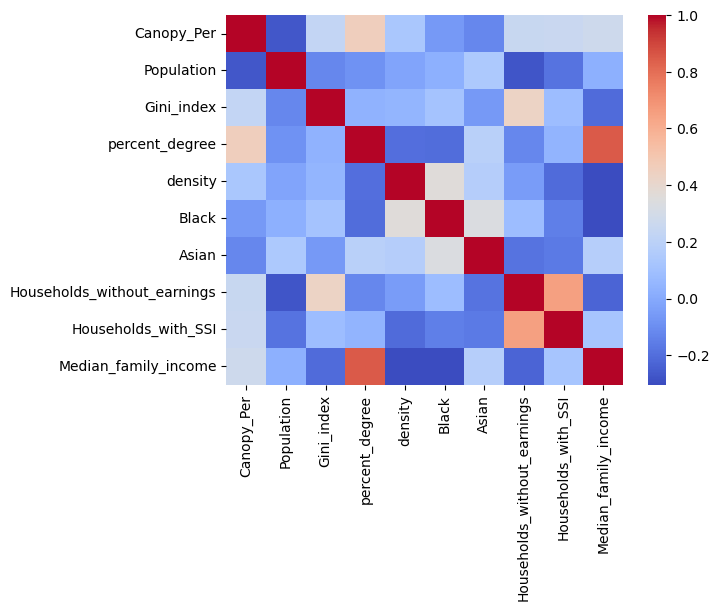

In [230]:
corr_matrix = X_imp.corr()
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm")
plt.show()

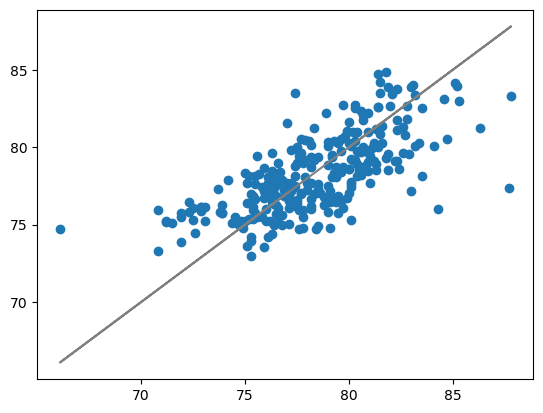

In [231]:
y_features = urb_mini['e(0)']
X_train, X_test, Y_train, Y_test = train_test_split(X_imp,y_features, test_size=0.3)

#linear regression model
lm = LinearRegression() 


lm.fit(X_train,Y_train)
prediction = lm.predict(X_test)
plt.scatter(Y_test,prediction)
plt.plot(Y_test, Y_test, color='grey')  # Line of best fit
plt.show()

In [209]:
lm.score(X_imp,y_features)

0.5394273112468979

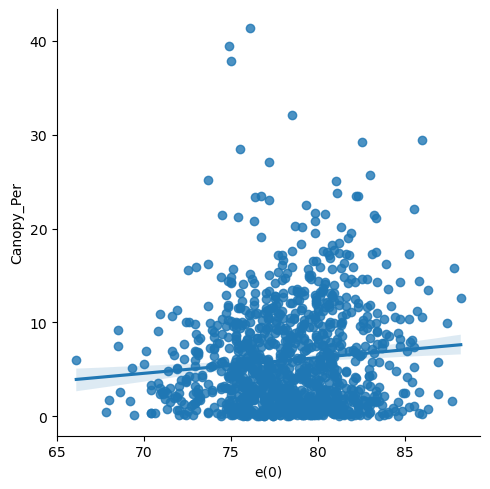

In [174]:
sns.lmplot(x="e(0)",y="Canopy_Per",data=canopylong)
plt.show()

In [101]:
stats.pearsonr(urb['Canopy_Per'], urb['e(0)'])

PearsonRResult(statistic=0.16834822368253327, pvalue=2.5665678087597224e-07)

In [269]:
X2

,const,Canopy_Per,Population,Median_household_income,Median_gross_rent,Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars),Aggregate_income_deficit_in_the_past_12_months,Total__Households,Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars),Working_hours,...,AmerIndian,PacIslander,Asian,Other,Biracial,Households_without_earnings,Households_with_SSI,Households_with_SupSI,Households_with_public_assistance,CC
0,1.0,0.217709,4198.0,22226.0,666.0,12377.0,4899200.0,1721.0,26591.0,52402.0,...,0.019057,0.000000,0.019295,0.029061,0.081944,0.455549,0.293434,0.269611,0.160372,Low
1,1.0,0.816603,7170.0,111149.0,1710.0,47702.0,1530400.0,2355.0,120599.0,130515.0,...,0.002929,0.000000,0.040725,0.034589,0.050488,0.165605,0.321019,0.059023,0.031423,Low
2,1.0,0.786056,7247.0,23582.0,771.0,11994.0,6675300.0,2518.0,24295.0,83871.0,...,0.005658,0.002622,0.036567,0.096040,0.090520,0.343924,0.266878,0.212073,0.166402,Low
3,1.0,3.161967,3810.0,62130.0,903.0,37065.0,1423700.0,1724.0,75375.0,83654.0,...,0.004199,0.000000,0.079528,0.053806,0.032546,0.136311,0.212297,0.058005,0.026102,Medium
4,1.0,2.123270,5389.0,58133.0,1105.0,27510.0,1612300.0,2138.0,55813.0,97078.0,...,0.010763,0.004639,0.036370,0.066803,0.046391,0.125351,0.185688,0.045837,0.019177,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
921,1.0,5.842546,4272.0,71741.0,957.0,36688.0,652000.0,1558.0,80852.0,75386.0,...,0.023876,0.000000,0.138343,0.038624,0.056882,0.217587,0.402439,0.052632,0.029525,Medium
922,1.0,1.014111,3512.0,28250.0,854.0,14594.0,1486400.0,1265.0,33496.0,49925.0,...,0.006834,0.011105,0.192483,0.093394,0.082005,0.290909,0.233202,0.196838,0.144664,Low
923,1.0,0.701465,8186.0,60994.0,1297.0,21923.0,1292500.0,2642.0,60294.0,155281.0,...,0.010139,0.007207,0.113364,0.128879,0.073296,0.139667,0.219909,0.093490,0.044285,Low
924,1.0,1.376458,4103.0,31780.0,776.0,12848.0,3735800.0,1319.0,38214.0,60573.0,...,0.014136,0.001219,0.090665,0.172069,0.078723,0.354056,0.246399,0.188779,0.083397,Low


In [232]:
X2 = sm.add_constant(X_imp)
est = sm.OLS(y_features, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                   e(0)   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.527
Method:                 Least Squares   F-statistic:                     104.2
Date:                Tue, 10 Dec 2024   Prob (F-statistic):          1.36e-143
Time:                        14:20:17   Log-Likelihood:                -2086.7
No. Observations:                 926   AIC:                             4195.
Df Residuals:                     915   BIC:                             4249.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

In [175]:
import statsmodels.api as sm

X2 = sm.add_constant(X_imp)
est = sm.OLS(y_features, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                   e(0)   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.540
Method:                 Least Squares   F-statistic:                     73.26
Date:                Tue, 10 Dec 2024   Prob (F-statistic):          6.95e-145
Time:                        13:51:35   Log-Likelihood:                -2072.1
No. Observations:                 926   AIC:                             4176.
Df Residuals:                     910   BIC:                             4253.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

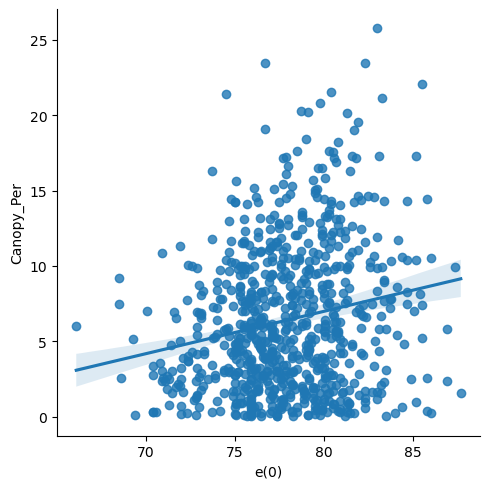

In [192]:
sns.lmplot(x="e(0)",y="Canopy_Per",data=urb_mini[urb_mini.density > 1000], legend = False)

In [197]:
urb_mini.Median_family_income.describe()

count       926.000000
mean      65023.771922
std       31227.220307
min       16786.000000
25%       40715.500000
50%       57807.500000
75%       82760.750000
max      181500.000000
Name: Median_family_income, dtype: float64

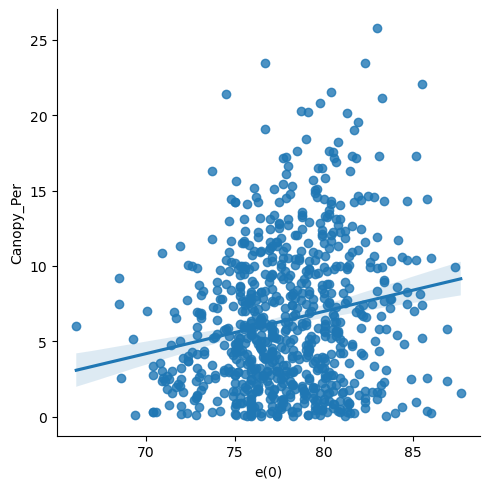

In [198]:
sns.lmplot(x="e(0)",y="Canopy_Per",data=urb_mini[(urb_mini.density > 1000) & (urb_mini.Population <100000)], legend = False)

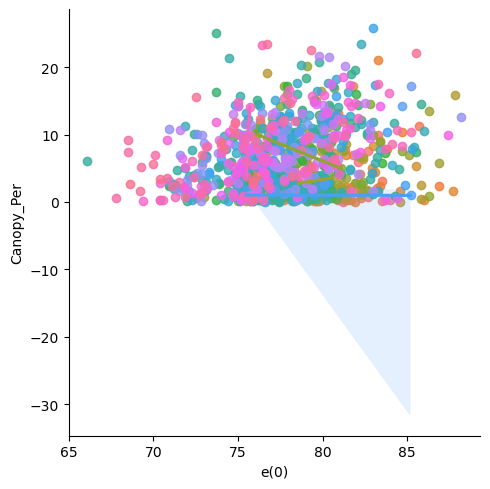

In [186]:
sns.lmplot(x="e(0)",y="Canopy_Per",data=urb_mini, hue = 'Households_without_earnings', legend = False)

<Axes: xlabel='e(0)', ylabel='Canopy_Per'>

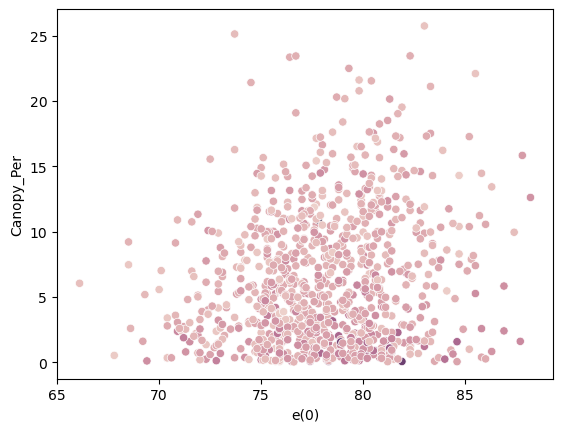

In [187]:
sns.scatterplot(x="e(0)",y="Canopy_Per",data=urb_mini, hue = 'Population', legend = False)

In [287]:
stk = canopylong[(canopylong.density >800)& (canopylong.NAME == 'Stockton, CA')].copy()
stk.dropna(subset = ['e(0)','Canopy_Per'],inplace = True)
stk.reset_index(inplace = True)
X_stk = stk[['Canopy_Per','Population',
       'Median_household_income', 'Median_gross_rent',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'percent_degree',
       'Poverty', 'Unemployed','density',
       'Households_with_public_assistance']].copy()
y_stk = stk['e(0)']

imputer = KNNImputer(n_neighbors=5)
imputedstk = imputer.fit_transform(X_stk)
X_impstk = pd.DataFrame(imputedstk, columns = X_stk.columns)



X2 = sm.add_constant(X_impstk)
est = sm.OLS(y_stk, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                   e(0)   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                     9.425
Date:                Thu, 12 Dec 2024   Prob (F-statistic):           1.70e-09
Time:                        22:32:33   Log-Likelihood:                -153.72
No. Observations:                  71   AIC:                             331.4
Df Residuals:                      59   BIC:                             358.6
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [105]:
#find linear correlations between longevity and the other features in my dataframe
urb = canopylong[canopylong.density >390].copy()
urb.dropna(subset = ['e(0)','Canopy_Per'],inplace = True)
urb.reset_index(inplace = True)
forcorr = ['Canopy_Per', 'Median_household_income',
       'Median_gross_rent', 'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree',
       'Poverty', 'Unemployed', 'assistance', 'density','White',
       'Black', 'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance']

corrlist = []
plist = []
for i in forcorr:
    corri = stats.pearsonr(canopylong[(canopylong[i].notna()) & (canopylong['e(0)'].notna())]['e(0)'], canopylong[(canopylong[i].notna()) & (canopylong['e(0)'].notna())][i])
    corrlist.append(corri[0])
    plist.append(corri[1])

In [107]:
#find linear correlations between longevity and the other features in my dataframe

forcorr = ['Canopy_Per', 'Median_household_income',
       'Median_gross_rent', 'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Working_hours', 'Gini_index', 'percent_degree',
       'Poverty', 'Unemployed', 'assistance', 'density','White',
       'Black', 'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance']

corrlist = []
plist = []
for i in forcorr:
    corri = stats.pearsonr(urb[(urb[i].notna()) & (urb['e(0)'].notna())]['e(0)'], urb[(urb[i].notna()) & (urb['e(0)'].notna())][i])
    corrlist.append(corri[0])
    plist.append(corri[1])

In [108]:
#make a dataframe to display correlations
corrs_with_longevity = pd.DataFrame(list(zip(forcorr, corrlist, plist)))
corrs_with_longevity.columns = ['feature', 'Pearsonsr', 'p-value']

In [109]:
corrs_with_longevity.sort_values(by = 'Pearsonsr')


,feature,Pearsonsr,p-value
10,Poverty,-0.618708,6.364357e-99
23,Households_with_SupSI,-0.570762,3.724573e-81
12,assistance,-0.509644,2.326907e-62
24,Households_with_public_assistance,-0.509644,2.326907e-62
11,Unemployed,-0.455296,1.408011e-48
19,Other,-0.384842,4.675177e-34
21,Households_without_earnings,-0.306396,1.407292e-21
16,AmerIndian,-0.252953,5.519986e-15
15,Black,-0.244736,4.271249e-14
8,Gini_index,-0.217100,2.434202e-11


In [111]:
#find linear correlations between canopy cover and the other features in my dataframe including rural areas

forcorr = ['Canopy_Per','Population',
       'Median_household_income', 'Median_gross_rent',
       'Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
       'Aggregate_income_deficit_in_the_past_12_months', 'Total__Households',
       'Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)',
    'Working_hours', 'Gini_index', 'percent_degree',
       'Poverty', 'Unemployed', 'assistance', 'density', 'White',
       'Black', 'AmerIndian', 'PacIslander', 'Asian', 'Other', 'Biracial',
       'Households_without_earnings', 'Households_with_SSI',
       'Households_with_SupSI', 'Households_with_public_assistance']

corrlist = []
plist = []
for i in forcorr:
    corri = stats.pearsonr(canopylong[(canopylong[i].notna()) & (canopylong['e(0)'].notna())]['e(0)'], canopylong[(canopylong[i].notna()) & (canopylong['e(0)'].notna())][i])
    corrlist.append(corri[0])
    plist.append(corri[1])
    

#make a dataframe to display correlations
corrs_with_longevity = pd.DataFrame(list(zip(forcorr, corrlist, plist)))
corrs_with_longevity.columns = ['feature', 'Pearsonsr', 'p-value']
corrs_with_longevity.sort_values(by = 'Pearsonsr')

,feature,Pearsonsr,p-value
11,Poverty,-0.590915,4.441653e-108
24,Households_with_SupSI,-0.559557,9.542035e-95
25,Households_with_public_assistance,-0.488651,2.408930e-69
13,assistance,-0.488651,2.408930e-69
12,Unemployed,-0.435989,5.325619e-54
20,Other,-0.315318,1.094380e-27
22,Households_without_earnings,-0.295412,2.370063e-24
16,Black,-0.255000,2.380800e-18
17,AmerIndian,-0.213314,3.543850e-13
14,density,-0.206362,2.070963e-12


In [112]:
#find VIF for each column

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
X = add_constant(X_imp)
VIF_X = pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns)

C:\Users\ariver10\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
C:\Users\ariver10\AppData\Local\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [113]:
VIF_X

const                                                                               0.000000
Canopy_Per                                                                          1.978476
Population                                                                         32.276215
Median_household_income                                                            25.383153
Median_gross_rent                                                                   4.145272
Per_capita_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)       19.095701
Aggregate_income_deficit_in_the_past_12_months                                      2.263535
Total__Households                                                                  20.288503
Median_family_income_in_the_past_12_months_(in_2021_inflation-adjusted_dollars)    20.712166
Working_hours                                                                      32.217965
Gini_index                                                            

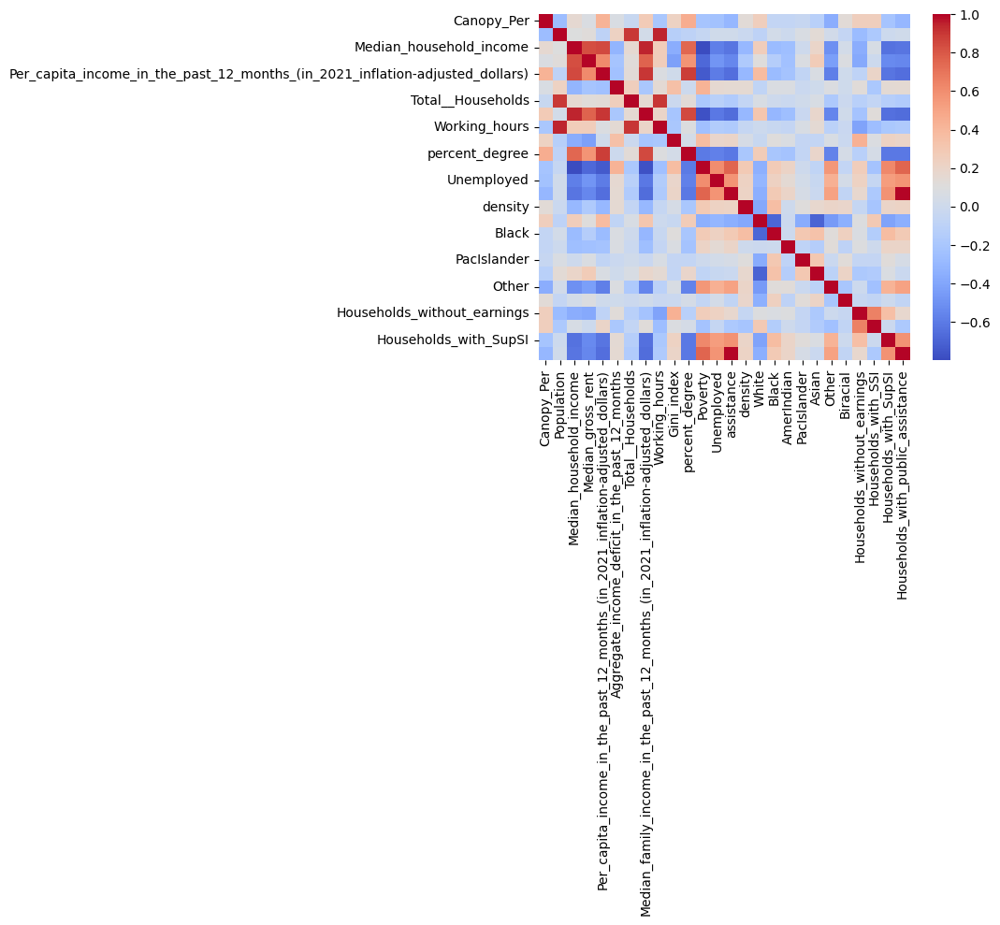

In [121]:
corr_matrix = X_imp.corr()
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm")
plt.show()
#drop: Total_Households, Working_hours, Median_household_income, Poverty, Households_with_public_assistance,AmerIndian, Pac

In [124]:
urb.describe().max

<bound method NDFrame._add_numeric_operations.<locals>.max of              index  Canopy_Per    Population  Median_household_income  \
count   926.000000  926.000000    926.000000               926.000000   
mean    670.136069    6.164360   5151.679266             57161.928726   
std     319.593520    4.970595   2343.342226             26254.592899   
min       3.000000    0.017574   1121.000000             14779.000000   
25%     419.250000    2.086412   3643.500000             37161.500000   
50%     685.500000    5.114328   4787.500000             51653.000000   
75%     941.750000    9.422983   6086.000000             71234.750000   
max    1199.000000   25.745677  23255.000000            170197.000000   

       Median_gross_rent  \
count         926.000000   
mean         1155.077754   
std           347.159573   
min           413.000000   
25%           903.000000   
50%          1072.500000   
75%          1345.750000   
max          3501.000000   

       Per_capita_income_in

<Axes: xlabel='Black', ylabel='White'>

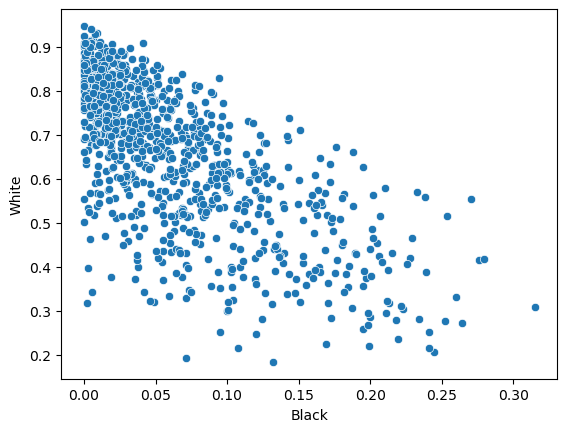

In [82]:
sns.scatterplot(data = urb, y = 'White', x = 'Black')

<Axes: >

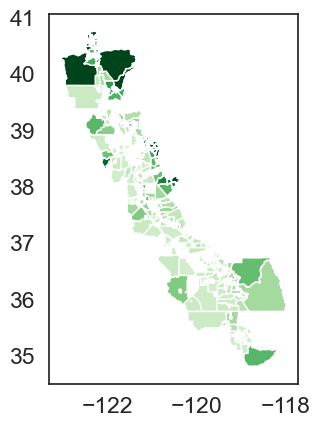

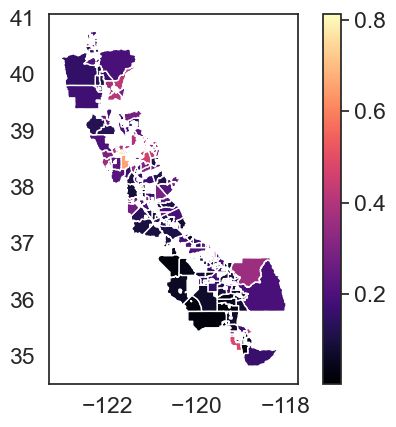

In [137]:
canopylong.plot(column = 'Canopy_Per', cmap = 'Greens', vmin = -5,vmax=20)

canopylong.plot(column = 'percent_degree', cmap = 'magma', legend = True)


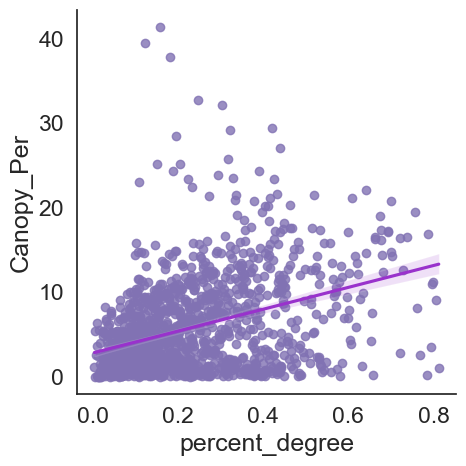

In [129]:
import seaborn as sns
sns.set(font_scale=1.5,style="white")
sns.lmplot(x="percent_degree",y="Canopy_Per",data=canopylong, scatter_kws={"color": "m"}, line_kws={"color": "darkorchid"})
plt.show()


<Axes: >

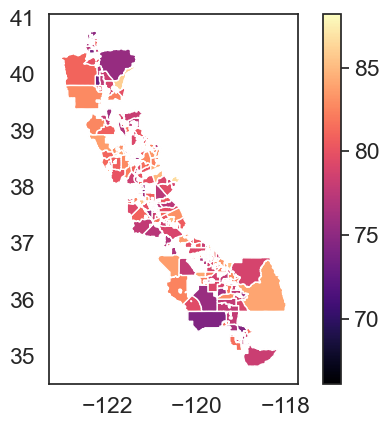

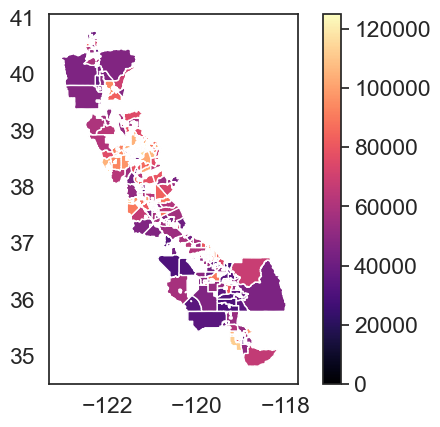

In [144]:
canopylong.plot(column = 'e(0)', cmap = 'magma', legend = True)

canopylong.plot(column = 'Median_household_income', cmap = 'magma', legend = True, vmin = 0, vmax = 125000)

<Axes: >

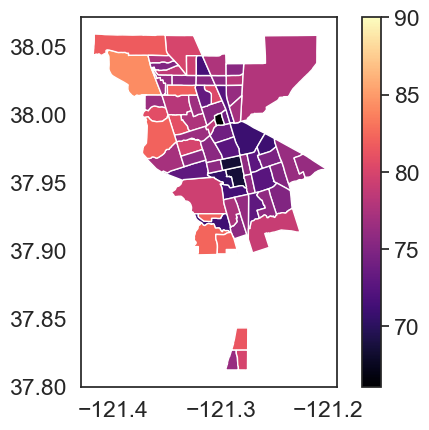

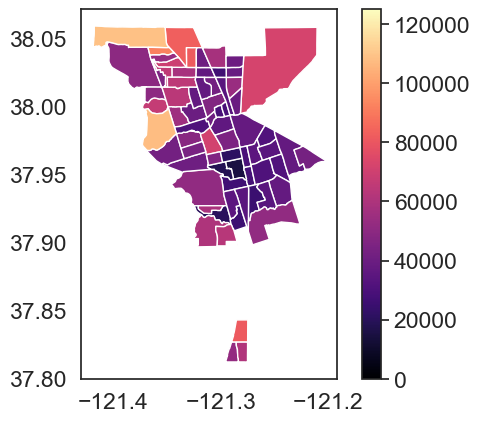

In [149]:
canopylong[(canopymap.NAME == 'Stockton, CA') & (canopymap.density > 200)].plot(column = 'e(0)', cmap = 'magma', legend = True, vmax = 90)

canopylong[(canopymap.NAME == 'Stockton, CA') &(canopymap.density > 200)].plot(column = 'Median_household_income', cmap = 'magma', legend = True, vmin = 0, vmax = 125000)

<Axes: >

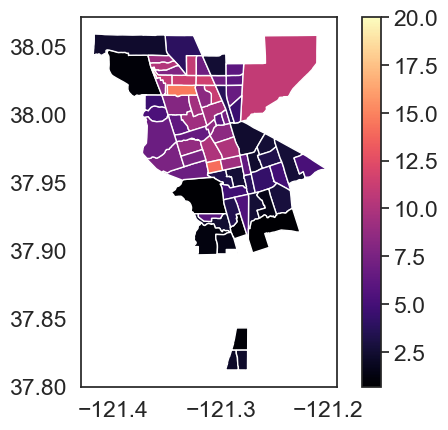

In [154]:
canopylong[(canopymap.NAME == 'Stockton, CA') &(canopymap.density > 200)].plot(column = 'Canopy_Per', cmap = 'magma', legend = True, vmax = 20)

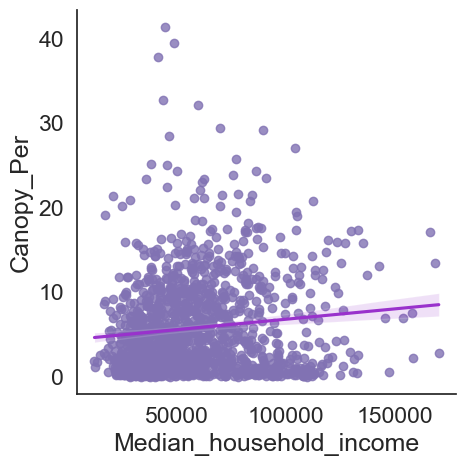

In [155]:
sns.set(font_scale=1.5,style="white")
sns.lmplot(x="Median_household_income",y="Canopy_Per",data=canopylong, scatter_kws={"color": "m"}, line_kws={"color": "darkorchid"})
plt.show()

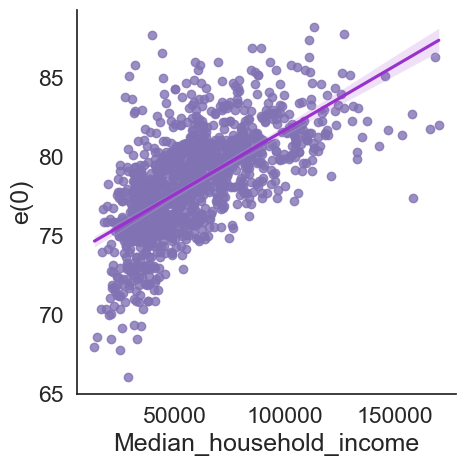

In [156]:
sns.lmplot(x="Median_household_income",y="e(0)",data=canopylong, scatter_kws={"color": "m"}, line_kws={"color": "darkorchid"})
plt.show()

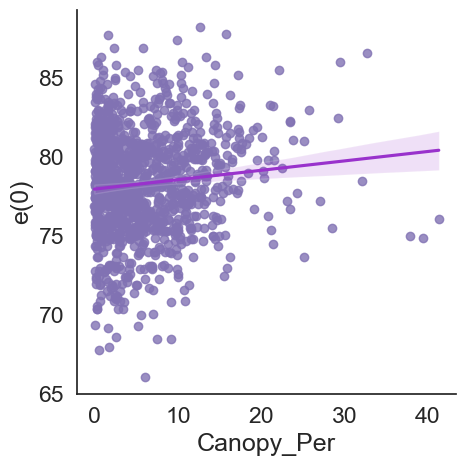

In [157]:
sns.lmplot(x="Canopy_Per",y="e(0)",data=canopylong, scatter_kws={"color": "m"}, line_kws={"color": "darkorchid"})
plt.show()

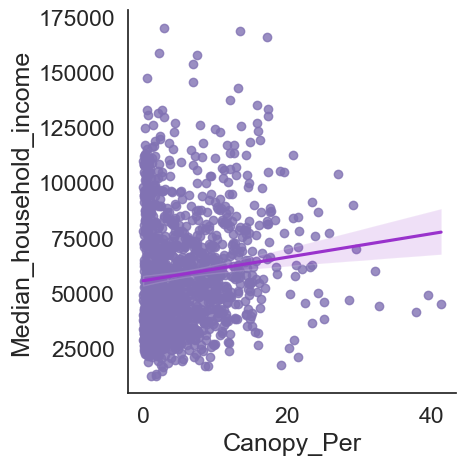

In [158]:
sns.lmplot(x="Canopy_Per",y="Median_household_income",data=canopylong, scatter_kws={"color": "m"}, line_kws={"color": "darkorchid"})
plt.show()

In [103]:
stats.pearsonr(minidf.dropna()['percent_degree'], minidf.dropna()['mean'])

PearsonRResult(statistic=0.5234768377616107, pvalue=1.063201017856298e-13)

# Past here is to consider for later, this is the original code from the Leah Campbell paper

In [ ]:

#----------------------------------------------------------
#           Create Clipped Geometries and Save
#----------------------------------------------------------
# Use this workflow to clip geometries to Tiger Boundary and filter by size
# The 1m and 30m canopy area estimates must be exported to asset using 01_Export_Initial_Data.py before doing this step.

# Mask CBGs with not enough Earth Define data or that are adjacent to areas with Earth Define data
# Min size = 15000 m2 (smallest full CBG is just over this area)
# Must be min size 200000 m2 OR have (Canopy_portion_of_CBG > 0.01 and canopy_area_1m_vs_30m > 0.9)
# Canopy_portion_of_CBG = (canopy data area (1m scale))/(Full CBG area)
# Canopy_Area_1m_vs_30m = (canopy data area (1m scale))/(canopy data area (30m scale)) - if this is at the edge of polygon, this ratio will be low

def setClippedGeometry(CBG):
	geo = CBG.geometry()
	newGeo = geo.intersection(tigerBoundary)
	CBG = CBG.setGeometry(newGeo)\
		.set('Data_Area_Acres',newGeo.area(5).multiply(0.000247105))\
		.set('GeoType',newGeo.type())
	return CBG

if export_geos:

	print('Export Clipped Geometries to Asset')

	outTable = []
	allCBGs = []
	print('made empty lists')
	canopyAreaAssets = ee.data.listAssets({'parent': 'projects/earthengine-legacy/assets/'+canopyAreaDir})['assets'][95:]
	print(canopyAreaAssets)
	# canopyAreaAssets = [{'id': 'users/leahscampbell/contour/tnc/urbantree/Canopy_Area_Tables/Canopy_Area_Sacramento'},
 #                        {'id': 'users/leahscampbell/contour/tnc/urbantree/Canopy_Area_Tables/Canopy_Area_LosAngeles--LongBeach--Anaheim'}]
	for cityAsset in canopyAreaAssets:
		print(cityAsset)
		#-------------------Read Data and Get Area Parameters----------------------
		cityName = cityAsset['id'].split('/')[6].split('_')[2]
		cityCBGs = ee.FeatureCollection(cityAsset['id'])
		print(cityAsset['id'])
		cityName = ee.Feature(cityCBGs.first()).get('NAME').getInfo()
		print(cityName)
		#print('Original Size', cityCBGs.size().getInfo())
		allCBGs.append(cityCBGs)
		tigerBoundary = ee.Feature(tiger.filter(ee.Filter.eq('NAME10', cityName)).first()).geometry()

		cityCBGs = cityCBGs.map(lambda cbg: ee.Feature(cbg).set('Portion_of_CBG',ee.Feature(cbg).getNumber('CanopyData_Area_1m').divide(ee.Feature(cbg).getNumber('aland')))\
		          .set('1m_vs_30m', ee.Feature(cbg).getNumber('CanopyData_Area_1m').divide(ee.Feature(cbg).getNumber('CanopyData_Area_30m')))\
		          .set('PolyArea_Acres', ee.Feature(cbg).getNumber('CanopyData_Area_1m').multiply(0.000247105)))

		#------------------------Apply Filters---------------------------------
		# Min size = 15000 m2 (smallest full CBG is just over this area)
		cityCBGs = cityCBGs.filter(ee.Filter.gt('PolyArea_Acres', canopyDataMaskMinSize*0.000247105))
		#print('Filter by size of Polygon', cityCBGs.size().getInfo())

		# Must be min size 200000 m2 OR have (Canopy_portion_of_CBG > 0.01 and canopy_area_1m_vs_30m > 0.9)
		cityCBGs = cityCBGs.filter(\
			ee.Filter.Or(ee.Filter.gt('PolyArea_Acres', canopyDataMask2MinSize*0.000247105), 
		    ee.Filter.And(ee.Filter.gt('Portion_of_CBG', canopyDataMaskPortion), ee.Filter.gt('1m_vs_30m',canopyDataMaskRatio))))
		#print('Second Filter', cityCBGs.size().getInfo())

		#------------------------Clip Geometries---------------------------------
		cityCBGs = cityCBGs.map(lambda CBG: setClippedGeometry(CBG))

		cityCBGs = cityCBGs.filter(ee.Filter.Or(ee.Filter.eq('GeoType','Polygon'), ee.Filter.eq('GeoType','MultiPolygon')))

		cityCBGs = cityCBGs.select(['geoid','aland','awater','PolyArea_Acres'])
		#print('Filtered Size', cityCBGs.size().getInfo())

		outStr = areaDict[cityName]
		t = ee.batch.Export.table.toCloudStorage(**{\
	        'collection': cityCBGs, 
	        'description': 'Clipped_Geometries_'+outStr+'_toStorage', 
	        'bucket': gcpBucket, 
	        'fileNamePrefix': 'Clipped_Geometries_CBG_Table_'+outStr, 
	        'fileFormat': 'CSV'})
		t.start()
		# t = ee.batch.Export.table.toAsset(**{\
		#     'collection': cityCBGs, 
		#     'description': 'Clipped_Geos_'+outStr+'_Table_toAsset', 
		#     'assetId': 'users/leahscampbell/contour/tnc/urbantree/Clipped_Geometries/Clipped_Geos_'+outStr})
		# t.start()
	# 	outTable.append(cityCBGs)

	# outTable = ee.FeatureCollection(outTable).flatten()
	# allCBGs = ee.FeatureCollection(allCBGs).flatten()
	# print(outTable.size().getInfo())
	# pdb.set_trace()


# To check for failed tasks:
# tasks = ee.data.getTaskList()[0:203]#len(canopyAreaAssets)]#
# status = [task['state'] for task in tasks]
# name = [task['description'] for task in tasks]
# for i, state in enumerate(status):
#   if state == 'FAILED':
#     print('FAILED: '+name[i])

# #To batch download files from bucket:
gcpBucket = 'urban-tree'
localdir = r'/Volumes/Seagate Backup Plus Drive/contour/tnc/urbantree/data/v8_Input_Data/Clipped_Geometries'
command = 'gsutil -m cp -r gs://urban-tree/Clipped_Geometries* "'+localdir+'/."'
os.system(command)


taskManagerLib.trackTasks()




